## Gesture Recognition Case Study

# <font color="black">Problem Statement:</font>

<font color="grey">Imagine yourself as a data scientist working for a company that makes really advanced smart TVs for homes. Your job is to create a cool feature for these smart TVs. This feature lets the TV recognize five different hand movements that a person does, and these movements can control the TV without needing a remote.</font>

<font color="grey">A special camera on the TV keeps an eye on these hand movements. Each hand movement corresponds to a specific thing the TV should do:</font>

 - <font color="grey">**Thumbs Up**:</font> <font color="orange">Makes the sound louder.</font>
 - <font color="grey">**Thumbs Down**:</font> <font color="orange">Makes the sound softer.</font>
 - <font color="grey">**Left Swipe**:</font> <font color="orange">Takes the movie back by 10 seconds.</font>
 - <font color="grey">**Right Swipe**:</font> <font color="orange">Takes the movie forward by 10 seconds.</font>
 - <font color="grey">**Stop**:</font> <font color="orange">Pauses the movie.</font>


In [1]:
# Increase notebook width
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
!pip install --upgrade pip

In [3]:
# !pip install --force-reinstall numpy==1.23.5
!pip install --force-reinstall numpy scikit-learn scipy

!pip install visualkeras --quiet
!pip install pillow==9.5 --quiet # Any version above 9.5 for pillow results in exception during model visualization
!pip install tensorflow --quiet
!pip install Openpyxl --quiet
!pip install texttable --quiet
# !pip uninstall --force numpy

# !pip install --force-reinstall  numpy==1.21 cupy-cuda115 --quiet
!pip install --force-reinstall matplotlib --quiet
!pip install pydot --quiet
!pip install graphviz --quiet
!pip install opencv-python --quiet
!pip install pillow --quiet
!pip install tabulate --quiet
# !pip install --upgrade scipy scikit-image --quite
!pip install scipy --quiet

  Using cached numpy-1.24.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
  Using cached scikit_learn-1.3.2-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  Using cached scipy-1.10.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (58 kB)
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
Using cached numpy-1.24.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
Using cached scikit_learn-1.3.2-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (11.1 MB)
Using cached scipy-1.10.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (34.5 MB)
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
Using cached threadpoolctl-3.5.0-py3-none-any.whl (18 kB)
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 3.5.0
    Uninstalling threadpoolctl-3.5.0:
      Successfully uninstalled 

In [4]:
# Running !nvidia-smi will output information about the NVIDIA GPUs installed on the system,
!nvidia-smi

Sun Jul 28 07:03:50 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A5000               On  | 00000000:1B:00.0 Off |                  Off |
| 30%   39C    P8              19W / 230W |      1MiB / 24564MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [6]:
# import important libraries
import numpy as np
import pandas as pd
import os
from skimage.io import imread
from skimage.transform import resize as imresize
import cv2
import matplotlib
import matplotlib.pyplot as plt
import datetime
import shutil

In [7]:
print(matplotlib.__version__)

3.7.5


In [8]:
# Import all the required Keras modules
from keras.models import Sequential, Model, load_model
from keras.layers import GlobalAveragePooling2D, Input, Flatten, BatchNormalization, Activation, Dropout
from tensorflow.keras import regularizers
from keras.layers import Dense, GRU, Flatten, TimeDistributed
from keras.layers.convolutional import Conv3D, MaxPooling3D, Conv2D, MaxPooling2D
from keras.layers.recurrent import LSTM
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras import optimizers
from keras.regularizers import l2
from keras.applications.vgg16 import VGG16 
#from keras.applications.resnet50 import ResNet50
from keras.applications.mobilenet import MobileNet
from tensorflow.keras.layers import LeakyReLU

import glob

import visualkeras
from visualkeras import Layer
from PIL import Image, ImageFont

import openpyxl
from openpyxl.styles import Font

from texttable import Texttable

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [9]:
# Ensure that the araial font file "Arial.ttf" is present in the location of this notebook. Link to file: https://github.com/techexorcist/gesture-recognition-deep-learning/blob/master/Arial.ttf
font = ImageFont.truetype("Arial.ttf", 70, encoding="unic")

In [10]:
#Ensures consistent random number sequences in NumPy.
import random as rn
rn.seed(30) 

# Keras and TensorFlow
from keras import backend as K
import tensorflow as tf
tf.random.set_seed(30)  # Setting seed for TensorFlow's random number generator

# Display TensorFlow version
print("TensorFlow Version:", tf.__version__)

# Generate a random integer using NumPy's random number generator
random_integer = rn.randint(1, 9999)
print("Random Integer:", random_integer)

TensorFlow Version: 2.7.0
Random Integer: 8833


#### <font > Loading data from CSV files & configuring the batch size for training.</font>

- The readlines() function reads all the lines from the train.csv file and stores them in a list.-   The np.random.permutation function is used to randomly shuffle these lines.

#### <font > Training and Validation Data:</font>
- train_doc and val_doc contain randomly shuffled lists of lines from the train.csv file, ensuring randomness for training and validation purposes, respectively.

#### <font >Batch Size Configuration:</font>

  - <font>The batch size refers to the number of data samples processed in a single iteration during each training epoch.</font>
  - <font> Modifying the batch size can affect both the efficiency of model training and memory usage.
  - <font>It's advisable to experiment with various batch sizes to determine the optimal value for your specific dataset and model.</font>


In [11]:
train_doc = np.random.permutation(open('/datasets/Project_data/train.csv').readlines())  
val_doc = np.random.permutation(open('/datasets/Project_data/val.csv').readlines())
batch_size = 32 #experiment with the batch size

In [12]:
# These paths are designed to be used as parameters in a generator function that 
# generates batches of data for training and validation 

train_path = '/datasets/Project_data/train' # To be used as source_path in generator function
val_path = '/datasets/Project_data/val'

### <font > Step1: EDA - Image Size Analysis and Augmentation Requirements</font>

### <font >Image Size Analysis:</font>

- Images are currently in dimensions of 120x160x3 or 360x360x3 and require standardization.
- The target dimensions for uniformity are 120x120x3 or 100x100x3.
- Standardizing image sizes for consistent model training, which require re-sizing.

### <font > Implementation Considerations:</font>

- Use ImageDataGenerator for resizing and augmentation, including rotation, flipping, and brightness adjustments.
- The resulting DataFrame includes columns named 'Name,' 'Gesture,' and 'Class,' providing a clear representation of the data for further analysis.


In [13]:
# Import necessary libraries
import pandas as pd

# Load the train data from the CSV file
train_df = pd.read_csv('/datasets/Project_data/train.csv', header=None)

# Split the data in each row using the ';' delimiter and expand into separate columns
train_df = train_df[0].str.split(pat=';', expand=True)

# Rename the columns for better clarity
train_df.rename(columns={0: 'Name', 1: 'Gesture', 2: 'Class'}, inplace=True)

# Display a random sample of 5 rows from the created data frame
train_df.sample(n=5, random_state=30)

,Name,Gesture,Class
152,WIN_20180926_16_54_08_Pro_Right_Swipe_new,Right_Swipe_new,1
314,WIN_20180925_18_02_58_Pro_Thumbs_Down_new,Thumbs_Down_new,3
12,WIN_20180925_17_33_08_Pro_Left_Swipe_new,Left_Swipe_new,0
413,WIN_20180925_17_51_17_Pro_Thumbs_Up_new,Thumbs_Up_new,4
74,WIN_20180926_17_17_35_Pro_Left_Swipe_new,Left_Swipe_new,0


<font >Checking for class imbalance is a crucial step in understanding the distribution of classes within a dataset. 
This information is valuable, especially when dealing with classification tasks, as imbalanced classes may impact the performance of machine learning models.</font>


In [14]:
# Check for class imbalance
train_df['Class'].value_counts()

3    137
1    137
0    136
2    130
4    123
Name: Class, dtype: int64

# <font >Observations:</font>

##### Image Shape Analysis

The following code analyzes the image shapes

In [15]:
# Let us see images are of which shape. It will help us in reshaping all of them to the same size
shape_120_160 = 0
shape_360_360 = 0
shape_rest = 0

for folder in train_df['Name']:
    temp = os.listdir('/datasets/Project_data/train'+'/'+ folder)
    if(imread('/datasets/Project_data/train'+'/'+ folder +'/'+temp[2]).shape == (120,160,3)):
        shape_120_160 += 1
    elif(imread('/datasets/Project_data/train'+'/'+ folder +'/'+temp[2]).shape == (360,360,3)):
        shape_360_360 += 1
    else:
        shape_rest += 1
         
print('Number of images with shape 120x160x3:', shape_120_160)
print('Number of images with shape 360x360x3:', shape_360_360)
print('Number of images with other shapes   :', shape_rest)

Number of images with shape 120x160x3: 479
Number of images with shape 360x360x3: 184
Number of images with other shapes   : 0


- All observed images have dimensions of either 120x160x3 or 360x360x3.
- They will be resized as needed to achieve uniform dimensions of 120x120x3 or 100x100x3 in later stages of the code.

##### Image Viewing and Augmentation :
The following function serves as a visual tool to inspect images and their modifications for a specific class. It provides insights into the effects of resizing, blurring, edge detection, and normalization, improving understanding of image transformations before they are used in machine learning models.

In [16]:
# This is a custom function to show the images and their augmentation
def imageview(class_img, source_path):
    
    # Get all 30 images in the folder
    images = os.listdir(source_path+'/'+ class_img)
    # Select one image (I have chosen 25th image) among the 30 images
    image = imread(source_path+'/'+ class_img +'/'+images[24])
    print('original:',image.shape)
    
    # Resize the image
    resized_img = cv2.resize(image, (120,120), interpolation = cv2.INTER_AREA)
    print('resized:',resized_img.shape)
    
    # Apply Gaussian Blur on the image
    blur_image = cv2.GaussianBlur(resized_img, (3,3), 3)
    print('blurred:',blur_image.shape)
    
    # Image Edge Detection
    edge_image = cv2.Canny(blur_image, 75, 150)
    # Get it into shape of 120x120x3 to maintain same shape through out (Canny removes the channels)
    edge_image1 = cv2.cvtColor(edge_image, cv2.COLOR_GRAY2BGR)
    print('edge:',edge_image1.shape)
    
    # Normalize the image
    norm_img = resized_img/255
    print('normalized:',norm_img.shape)
    
    fig = plt.figure(figsize = (20, 30))
    
    plt.subplot(151)
    plt.title('Original')
    plt.imshow(image)
    
    plt.subplot(152)
    plt.title('Resized')
    plt.imshow(resized_img) 
     
    plt.subplot(153)
    plt.title('Gaussian Blur')
    plt.imshow(blur_image)
    
    plt.subplot(154)
    plt.title('Edges')
    plt.imshow(edge_image1, cmap = 'gray')
    
    plt.subplot(155)
    plt.title('Normalized')
    plt.imshow(norm_img)

    plt.show()

In [17]:
# Consider two images (one with 120x160x3 and another with 360x360x3) each from every class for analysis
class_0_120 = train_df[train_df['Class']=='0'].reset_index()['Name'][2]
class_0_360 = train_df[train_df['Class']=='0'].reset_index()['Name'][133]
class_1_120 = train_df[train_df['Class']=='1'].reset_index()['Name'][0]
class_1_360 = train_df[train_df['Class']=='1'].reset_index()['Name'][131]
class_2_120 = train_df[train_df['Class']=='2'].reset_index()['Name'][1]
class_2_360 = train_df[train_df['Class']=='2'].reset_index()['Name'][121]
class_3_120 = train_df[train_df['Class']=='3'].reset_index()['Name'][1]
class_3_360 = train_df[train_df['Class']=='3'].reset_index()['Name'][130]
class_4_120 = train_df[train_df['Class']=='4'].reset_index()['Name'][5]
class_4_360 = train_df[train_df['Class']=='4'].reset_index()['Name'][111]

Image for Swipe Left:
original: (120, 160, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


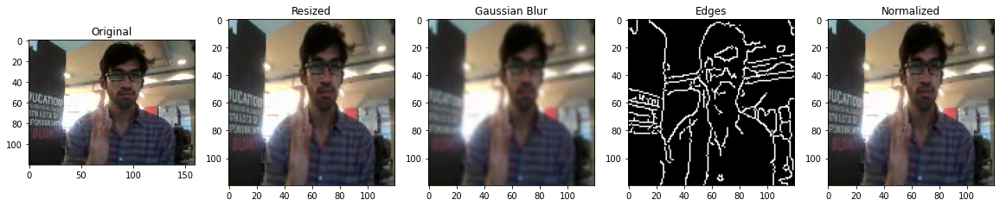

original: (360, 360, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


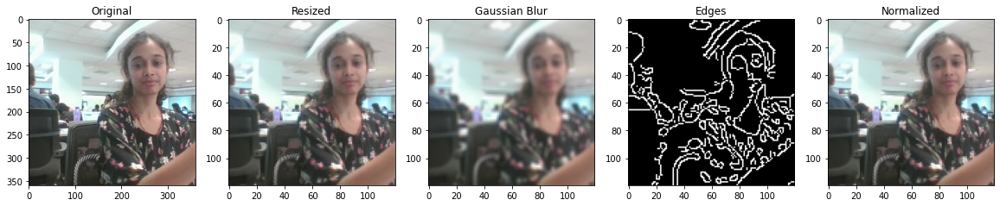

Image for Swipe Right:
original: (120, 160, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


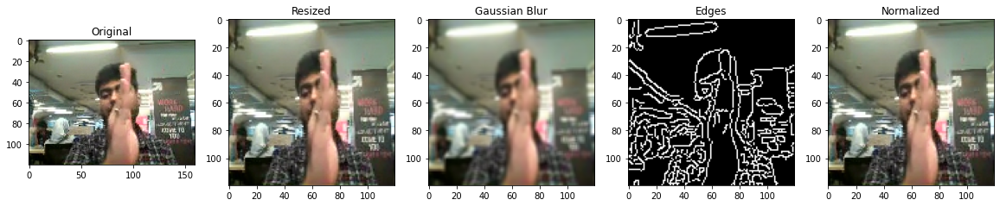

original: (360, 360, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


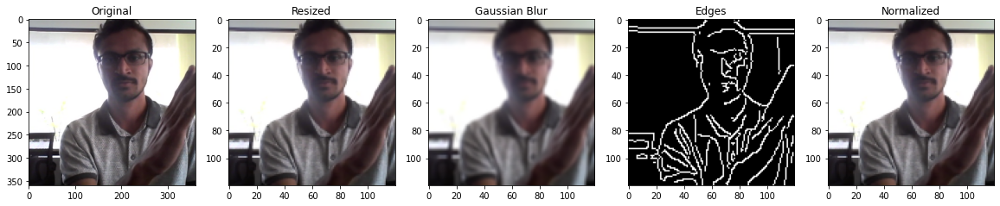

Image for Stop:
original: (120, 160, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


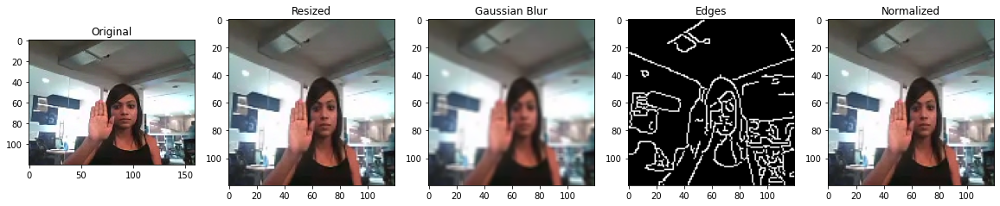

original: (360, 360, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


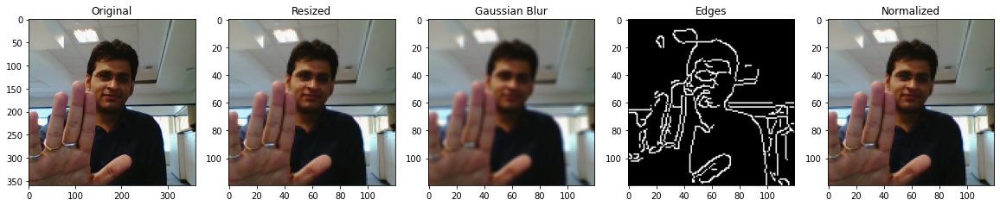

Image for Volume Down:
original: (120, 160, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


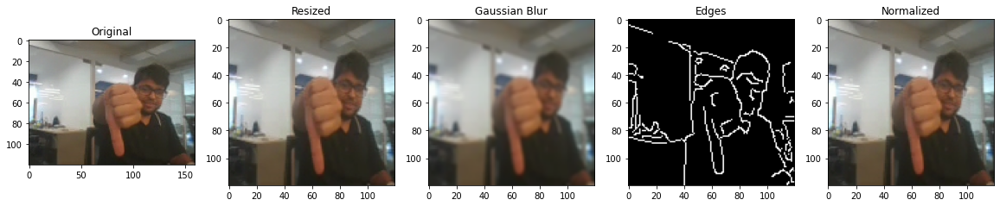

original: (360, 360, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


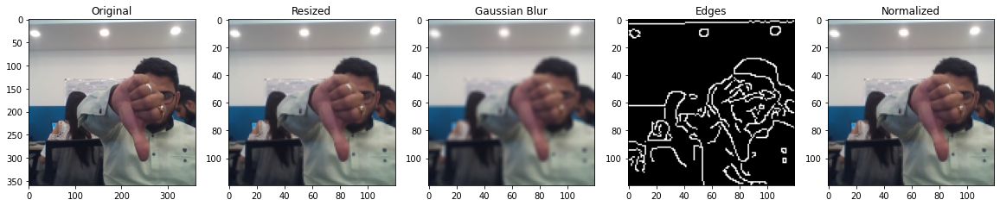

Image for Volume Up:
original: (120, 160, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


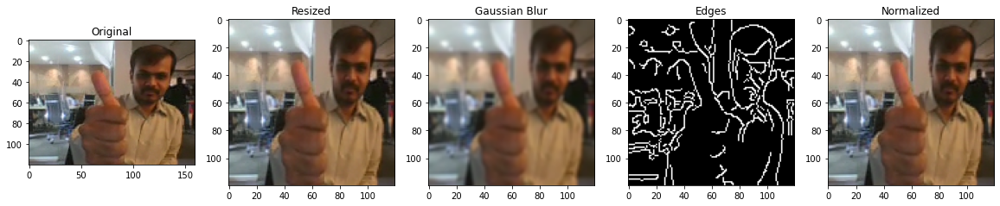

original: (360, 360, 3)
resized: (120, 120, 3)
blurred: (120, 120, 3)
edge: (120, 120, 3)
normalized: (120, 120, 3)


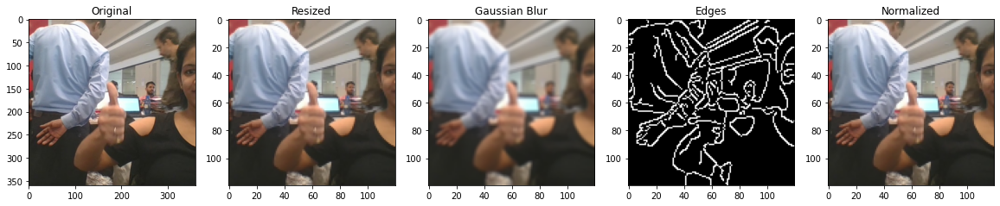

In [18]:
# View the images with their augmented outputs
print('\033[1m' + 'Image for Swipe Left:' + '\033[0m')
imageview(class_0_120, '/datasets/Project_data/train')
imageview(class_0_360, '/datasets/Project_data/train')
print('\033[1m' + 'Image for Swipe Right:' + '\033[0m')
imageview(class_1_120, '/datasets/Project_data/train')
imageview(class_1_360, '/datasets/Project_data/train')
print('\033[1m' + 'Image for Stop:' + '\033[0m')
imageview(class_2_120, '/datasets/Project_data/train')
imageview(class_2_360, '/datasets/Project_data/train')
print('\033[1m' + 'Image for Volume Down:' + '\033[0m')
imageview(class_3_120, '/datasets/Project_data/train')
imageview(class_3_360, '/datasets/Project_data/train')
print('\033[1m' + 'Image for Volume Up:' + '\033[0m')
imageview(class_4_120, '/datasets/Project_data/train')
imageview(class_4_360, '/datasets/Project_data/train')

### <font >Step 2: Generator Implementation</font>


- Creates batches of video data for neural network training.
- Processes video data within a defined directory structure.
- Incorporates Gaussian-blurred image augmentation for training
- 
Allows experimentation with different parameters (batch size, dimensions) to optimize training.

#####  Parameter:
- `source_pah `: Directory path for video dat.
- `folder_lit `: List of video folder.
- `batch_siz `: Number of video sequences per iteratio.
- `num_frams `: Number of frames per vide.
- `frame_heigt - `frame_widh `: Desired frame dimension.
- `augmen `: Enable/disable data augmentation (default: False.
- `normaliz `: Enable/disable pixel value normalization (default: False
  .
#####  Function Overview:
- Image Indexing: Generates indices based on frame count.
- Data Generation Loop: Generates data batches indefinitely.
- Batch Processing: Loads, resizes, augments, and encodes data.
- Data Yielding: Yields data and labels for model training.
- Handling Remaining Data: Processes leftover data points


In [19]:
# The generator function
def generator(source_path, folder_list, batch_size, num_frames, frame_height, frame_width, augment, normalize):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    # Based on the number of frames, some frames can be skipped in between. Use linspace function to do that
    img_idx = np.round(np.linspace(0, 29, num_frames)).astype(int) #create a list of image numbers you want to use for a particular video
    print("Image Indexes: ", img_idx)
    while True:
        t           = np.random.permutation(folder_list)
        num_batches = int(len(t)//batch_size) # calculate the number of batches
        for batch in range(num_batches):      # we iterate over the number of batches
            
            batch_data      = np.zeros((batch_size, num_frames, frame_height, frame_width, 3)) # x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB
            batch_labels    = np.zeros((batch_size,5)) # batch_labels is the one hot representation of the output
            batch_data_blur = np.zeros((batch_size, num_frames, frame_height, frame_width, 3))
            batch_data_edge = np.zeros((batch_size, num_frames, frame_height, frame_width, 3))           
            
            for folder in range(batch_size): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate over the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #crop the images and resize them. Note that the images are of 2 different shape 
                    #and the conv3D will throw error if the inputs in a batch have different shapes
                    # Resize the Images maintaining the aspect ratio
                    image_resized = cv2.resize(image, (frame_height,frame_width), interpolation = cv2.INTER_AREA)
                    
                    if(normalize == True):
                        batch_data[folder,idx,:,:,0] = (image_resized[:,:,0])/255.0 #normalise and feed in the image
                        batch_data[folder,idx,:,:,1] = (image_resized[:,:,1])/255.0 #normalise and feed in the image
                        batch_data[folder,idx,:,:,2] = (image_resized[:,:,2])/255.0 #normalise and feed in the image       
                    else:
                        batch_data[folder,idx,:,:,0] = (image_resized[:,:,0]) #normalise and feed in the image
                        batch_data[folder,idx,:,:,1] = (image_resized[:,:,1]) #normalise and feed in the image
                        batch_data[folder,idx,:,:,2] = (image_resized[:,:,2]) #normalise and feed in the image                          
                    
                    # Add augmentation (Gaussian Noise Images)
                    if (augment == True):                
                        # Add blurred images
                        image_blur = cv2.GaussianBlur(image_resized,(3,3),3)
                        if(normalize == True):
                            batch_data_blur[folder,idx,:,:,0] = (image_blur[:,:,0])/255 #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,1] = (image_blur[:,:,1])/255 #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,2] = (image_blur[:,:,2])/255 #normalise and feed in the image
                        else:
                            batch_data_blur[folder,idx,:,:,0] = (image_blur[:,:,0]) #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,1] = (image_blur[:,:,1]) #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,2] = (image_blur[:,:,2]) #normalise and feed in the image                          
                  
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            
            if(augment == True):
                # Add blurred images to the data
                batch_data    = np.concatenate([batch_data, batch_data_blur])
                batch_labels  = np.concatenate([batch_labels, batch_labels])
            
            yield batch_data, batch_labels #you yield the batch_data and the batch_labels, remember what does yield do
        
        # write the code for the remaining data points which are left after full batches
        remaining_data = len(t) % batch_size
        if(remaining_data != 0):
            
            batch_data = np.zeros((remaining_data, num_frames, frame_height, frame_width, 3)) # x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB
            batch_labels    = np.zeros((remaining_data,5))                                    # batch_labels is the one hot representation of the output
            batch_data_blur = np.zeros((remaining_data, num_frames, frame_height, frame_width, 3))
            batch_data_edge = np.zeros((remaining_data, num_frames, frame_height, frame_width, 3))           

            for folder in range(remaining_data): # iterate over the batch_size
                imgs = os.listdir(source_path+'/'+ t[folder + (num_batches*batch_size)].split(';')[0]) # read all the images in the folder
                for idx,item in enumerate(img_idx): #  Iterate iver the frames/images of a folder to read them in
                    image = imread(source_path+'/'+ t[folder + (num_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                    
                    #crop the images and resize them. Note that the images are of 2 different shape 
                    #and the conv3D will throw error if the inputs in a batch have different shapes
                    # Resize the Images maintaining the aspect ratio
                    image_resized = cv2.resize(image, (frame_height,frame_width), interpolation = cv2.INTER_AREA)
                    
                    if(normalize == True):
                        batch_data[folder,idx,:,:,0] = (image_resized[:,:,0])/255.0 #normalise and feed in the image
                        batch_data[folder,idx,:,:,1] = (image_resized[:,:,1])/255.0 #normalise and feed in the image
                        batch_data[folder,idx,:,:,2] = (image_resized[:,:,2])/255.0 #normalise and feed in the image       
                    else:
                        batch_data[folder,idx,:,:,0] = (image_resized[:,:,0]) #normalise and feed in the image
                        batch_data[folder,idx,:,:,1] = (image_resized[:,:,1]) #normalise and feed in the image
                        batch_data[folder,idx,:,:,2] = (image_resized[:,:,2]) #normalise and feed in the image     
                    
                    # Add augmentation (Gaussian Noise Images)
                    if(augment == True):
                        # Add blurred images
                        image_blur = cv2.GaussianBlur(image_resized,(3,3),3)

                        if(normalize == True):
                            batch_data_blur[folder,idx,:,:,0] = (image_blur[:,:,0])/255 #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,1] = (image_blur[:,:,1])/255 #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,2] = (image_blur[:,:,2])/255 #normalise and feed in the image
                        else:
                            batch_data_blur[folder,idx,:,:,0] = (image_blur[:,:,0]) #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,1] = (image_blur[:,:,1]) #normalise and feed in the image
                            batch_data_blur[folder,idx,:,:,2] = (image_blur[:,:,2]) #normalise and feed in the image    

                batch_labels[folder, int(t[folder + (num_batches*batch_size)].strip().split(';')[2])] = 1

            if(augment == True):
                # Add blurred images to the data
                batch_data = np.concatenate([batch_data, batch_data_blur])
                batch_labels = np.concatenate([batch_labels, batch_labels])

            yield batch_data, batch_labels 

####  <font >Step3:  Test the Generator Function on Training data</font>

- The following code tests the functionality of the previously defined generator function on the training dataset. It creates batches of video data and examines their shapes.
#####  <font >Testing Parameters:</font>
- <font > num_frames: Integer, the number of frames to be considered for each video.</font>
- <font > frame_height: Integer, the desired height of each frame.</font>
- <font > frame_width: Integer, the desired width of each frame.</font>
- <font > augment: Boolean, indicating whether data augmentation should be applied (set to False for this test).</font>
- <font > normalize: Boolean, indicating whether pixel values should be normalized to the range [0, 1].</font>


In [20]:
# Test the Generator function on training data set

num_frames    = 20 
frame_height  = 120
frame_width   = 120
augment       = False
normalize     = True

train_generator = generator(train_path, train_doc, batch_size, num_frames, frame_height, frame_width, augment, normalize)

for i in range(int(len(train_doc)//batch_size + 1)):
    batch_data_temp, batch_label_temp = next(train_generator)
    print('Shape of each batch: ',batch_data_temp.shape)
    print('Shape of each batch label: ',batch_label_temp.shape)      

Source path =  /datasets/Project_data/train ; batch size = 32
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each ba

##### <font >Step3: Test the Generator Function on Validation data set</font>
- The following code tests the functionality of the previously defined generator function on the validation dataset. It creates batches of video data and examines their shapes.

##### <font >Testing Parameters:</font>
- <font >num_frames: Integer, the number of frames to be considered for each video.</font>
- <font >frame_height: Integer, the desired height of each frame.</font>
- <font >frame_width: Integer, the desired width of each frame.</font>
- <font >augment: Boolean, indicating whether data augmentation should be applied (set to False for this test).</font>
- <font >normalize: Boolean, indicating whether pixel values should be normalized to the range [0, 1].</font>


In [21]:
# Test the Generator function on validation data set

num_frames    = 20
frame_height  = 120
frame_width   = 120
augment       = False
normalize     = True

val_generator = generator(val_path, val_doc, batch_size, num_frames, frame_height, frame_width, augment, normalize)

if (len(val_doc)%batch_size) == 0:
    for i in range(int(len(val_doc)/batch_size)):
        batch_data_temp, batch_label_temp = next(val_generator)
        print('Shape of each batch: ',batch_data_temp.shape)
        print('Shape of each batch label: ',batch_label_temp.shape)        
else:
    for i in range(int(len(val_doc)//batch_size + 1)):
        batch_data_temp, batch_label_temp = next(val_generator)
        print('Shape of each batch: ',batch_data_temp.shape)
        print('Shape of each batch label: ',batch_label_temp.shape)  

Source path =  /datasets/Project_data/val ; batch size = 32
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (32, 20, 120, 120, 3)
Shape of each batch label:  (32, 5)
Shape of each batch:  (4, 20, 120, 120, 3)
Shape of each batch label:  (4, 5)


In [22]:
curr_dt_time = datetime.datetime.now()
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
num_epochs = 30 # choose the number of epochs
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 30


##  <font > Implementation of Various Model(s):</font>

#### <font > Step 4: Designing the Conv3D Model Architecture</font>

- This section details the considerations and steps for building a Conv3D neural network model using Keras, focusing on optimizing accuracy while minimizing the number of parameters. The goal is to create a model well-suited for tasks involving video data, such as gesture recognition.

####  <font >Usage of Conv3D and MaxPooling3D:</font>

####  <font >Convolution Layer Selection:</font>
- <font >Utilize Conv3D layers for 3D convolutions on video data, essential for capturing spatiotemporal features within video sequences.</font>

####  <font >Pooling Operations:</font>
- <font >Incorporate MaxPooling3D layers to down-sample spatial dimensions, aiding computational efficiency while preserving essential information.</font>

####  <font >TimeDistributed for Conv2D + RNN Model:</font>

<font >- TimeDistributed Layer:</font>
  - <font >When integrating Conv2D with Recurrent Neural Networks (RNN), use TimeDistributed layers to apply 2D convolutions across temporal slices, which is crucial for effectively handling video sequences.</font>

####  <font >Softmax Output Layer:</font>

<font >- Output Layer:</font>
  - <font >The final layer of the network should be a softmax layer, which is typically used in classification tasks to generate probability distributions across different classes.</font>

####  <font >Optimization for Memory Constraints:</font>

<font >- Parameter Efficiency:</font>
  - <font >Optimize the model to achieve high accuracy with minimal parameters, which is essential for memory-constrained scenarios like deploying the model on webcams or resource-limited devices.</font>


###  <font >User-defined Custom Functions:</font>

<font >Let's define a set of custom functions that are essential for the training and evaluation of the model:</font>

1. <font >**generator()**</font>
<font >The generator() function is assumed to be already implemented and is responsible for creating a data generator, which efficiently loads batches for model training.</font>

2. <font >**trainer()**</font>
<font >The trainer() function trains the specified neural network model using training and validation data generators. It computes and returns the accuracy and loss values throughout the training process.</font>

3. <font >**modelplot(history)**</font>
<font >The modelplot() function plots the accuracy and loss curves based on the training history obtained during the training process.</font>


In [23]:
import re
from tabulate import tabulate

# code to retain only the best models, automating it instead of manual observation

def retain_best_model(history, mod_name_dir, model_name):
    if re.search("Test", mod_name_dir):
        return
    
    best_mod_name_dir = "Best-"+mod_name_dir
    if not os.path.exists(best_mod_name_dir):
        os.mkdir(best_mod_name_dir)
    best_model_loss = min(history.history["loss"])
    index_best_model_loss = history.history["loss"].index(best_model_loss)
    best_epoch = index_best_model_loss + 1  # Adding 1 because epoch numbers are 1-based
    best_model_cat_acc = history.history["categorical_accuracy"][index_best_model_loss]
    best_model_val_cat_acc = history.history["val_categorical_accuracy"][index_best_model_loss]
    best_model_val_loss = history.history["val_loss"][index_best_model_loss]

    
    
    # Create a table
    table = [
    ["Metric", "Value"],
    ["Model Name", model_name],
    ["Best Epoch", best_epoch],
    ["Index For Best Model Loss", index_best_model_loss],
    ["Best Model Loss", best_model_loss],
    ["Best Model Categorical Accuracy", best_model_cat_acc],
    ["Best Model Validation Categorical Accuracy", best_model_val_cat_acc],
    ["Best Model Validation Loss", best_model_val_loss]
    ]
    
    # Print the table
    print(tabulate(table, headers="firstrow", tablefmt="grid"))

    
    # filepath = mod_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'
    
    # Reconstruct the model file name
    model_filename = f"model-{best_epoch:05d}-{best_model_loss:.5f}-{best_model_cat_acc:.5f}-{best_model_val_loss:.5f}-{best_model_val_cat_acc:.5f}.h5"
    best_model_filename = f"model-{best_epoch:05d}-{best_model_loss:.5f}-{best_model_cat_acc:.5f}-{best_model_val_loss:.5f}-{best_model_val_cat_acc:.5f}.h5"

    # Define source and destination paths
    source_path = os.path.join(mod_name_dir, model_filename)
    destination_path = os.path.join(best_mod_name_dir, best_model_filename)
#     print (f"source_path :{source_path}")
#     print (f"destination_path : {destination_path}")
    # Move or rename the best model file
    try:
        shutil.move(source_path, destination_path)
        shutil.rmtree(mod_name_dir)
    except Exception as e:
        print(f"An error occurred: {e}")    

In [24]:

# Function to fit and train the Model
def trainer(model, model_name, num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize):
    #normalize = normalize
    # Model with the training data
    train_gen = generator(train_path, train_doc, size_batch, num_frames, frame_height, frame_width, augment, normalize)
    # Calculate steps per epoch
    if (len(train_doc)%size_batch) == 0:
        train_steps_per_epoch = int(len(train_doc)/size_batch)
    else:
        train_steps_per_epoch = (len(train_doc)//size_batch) + 1

    # Model with validation data (Augmentation is not applied on the validation data set)
    augment = False
    val_gen = generator(val_path, val_doc, size_batch, num_frames, frame_height, frame_width, augment, normalize)
    # Calculate steps per epoch
    if (len(val_doc)%size_batch) == 0:
        val_steps_per_epoch = int(len(val_doc)/size_batch)
    else:
        val_steps_per_epoch = (len(val_doc)//size_batch) + 1

    # Callback function to save models   
    curr_dt_time = datetime.datetime.now() # Current date and time to store the models with timestamp
    mod_name = model_name + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
    if not os.path.exists(mod_name):
        os.mkdir(mod_name)        
    filepath = mod_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

    checkpoint = ModelCheckpoint(filepath, monitor='val_categorical_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)        
        
    # Callback function to reduce learning rate upon reaching a plateau
    LR = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.2, patience = 4, verbose = 1) # write the REducelronplateau code here
    
    # Early Stop callback function
    earlystop = EarlyStopping(monitor = "val_loss", mode='auto', patience = 10, verbose = 1)
    
    # List of all callback functions
    callbacks_list = [checkpoint, LR, earlystop]

    history_obj = model.fit(train_gen, steps_per_epoch = train_steps_per_epoch, 
                                      epochs = num_epochs, verbose = 1,
                                      callbacks = callbacks_list, workers = 1, 
                                      initial_epoch = 0, class_weight = None,
                                      validation_data = val_gen, 
                                      validation_steps = val_steps_per_epoch,
                                      shuffle=False)                 
    
    retain_best_model(history_obj, mod_name, model_name)
    
    return history_obj

In [25]:
# Custom function for plotting accuracies and losses of the model
def modelplot(history):
    
    fig = plt.figure(figsize = (16, 5))
    
    # Plot the loss
    plt.subplot(121)
    plt.title('Loss')
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['train_loss','val_loss'])
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    
    # Plot the accuracy
    plt.subplot(122)
    plt.title('Accuracy')
    plt.plot(history.history['categorical_accuracy'])
    plt.plot(history.history['val_categorical_accuracy'])
    plt.legend(['train_categorical_accuracy','val_categorical_accuracy'])
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    
    plt.show()

###  <font >Sample Model to Test</font>
- The Conv3D test model acts as a preliminary architecture for experimentation and evaluation.
- It is ideal for a test run to assess its performance and make any necessary adjustments before proceeding with more extensive training.


In [26]:
# Test Conv3D Model for test run
def model_Conv3D_Test(num_frames, frame_height, frame_width):

    model = Sequential()
    model.add(Conv3D(16, (3,3,3), 
                     input_shape = (num_frames, frame_height, frame_width, 3),     
                     padding = 'same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(3,3,3)))
    
    model.add(Conv3D(32, (2, 2, 2), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(64, (2, 2, 2), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(128, (2, 2, 2), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))

    model.add(Flatten())

    model.add(Dense(256))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.25))
    
    # Final softmax layer for the 5 classes
    model.add(Dense(5))
    model.add(Activation('softmax'))
    
    return model

#### <font >Deciding the batch size, image size, and number of frames</font>

- <font >The time and memory required to train the model are significantly influenced by the batch size, image size, and number of frames. Here’s what we do:</font>
  - <font >Experiment with different batch size till we hit the OOM error of GPU</font>
  - <font >Let us try three image sizes - 100x100, 120x120, and 160x160</font>
  - <font >Choose appropriate number of frames</font>

# <font >Observations:</font>
#### <font >Choosing Batch Size</font>
- We select a batch size of 32 and 24 frames to prevent out-of-memory (OOM) errors.
- However, these values may be adjusted based on the model architecture if necessary.


In [27]:
# Model with image size 100x100

num_frames    = 24
frame_height  = 100
frame_width   = 100
batch_size    = 32
num_epochs    = 2
augment       = False # Add Gaussian Blurring taken care in Generator function
normalize     = True  # Diving image channel wise by 255 taken care in Generator function

model = model_Conv3D_Test(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
trainer(model, 'Conv3D_Test', num_epochs, batch_size, num_frames, frame_height, frame_width, augment, normalize)



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d (Conv3D)             (None, 24, 100, 100, 16)  1312      
                                                                 
 activation (Activation)     (None, 24, 100, 100, 16)  0         
                                                                 
 batch_normalization (BatchN  (None, 24, 100, 100, 16)  64       
 ormalization)                                                   
                                                                 
 max_pooling3d (MaxPooling3D  (None, 8, 33, 33, 16)    0         
 )                                                               
                                                                 
 conv3d_1 (Conv3D)           (None, 8, 33, 33, 32)     4128      
                                                                 
 activation_1 (Activation)   (None, 8, 33, 33, 32)     0

2024-07-28 07:04:40.491940: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2024-07-28 07:04:40.492004: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22110 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:1b:00.0, compute capability: 8.6


Source path =  /datasets/Project_data/train ; batch size = 32
Image Indexes:  [ 0  1  3  4  5  6  8  9 10 11 13 14 15 16 18 19 20 21 23 24 25 26 28 29]
Epoch 1/2


2024-07-28 07:04:44.884405: I tensorflow/stream_executor/cuda/cuda_dnn.cc:377] Loaded cuDNN version 8302
2024-07-28 07:04:46.749267: I tensorflow/stream_executor/cuda/cuda_blas.cc:1792] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


21/21 [==============================] - ETA: 0s - loss: 1.4250 - categorical_accuracy: 0.4932Source path =  /datasets/Project_data/val ; batch size = 32
Image Indexes:  [ 0  1  3  4  5  6  8  9 10 11 13 14 15 16 18 19 20 21 23 24 25 26 28 29]

Epoch 00001: val_categorical_accuracy improved from -inf to 0.21000, saving model to Conv3D_Test_2024-07-2807_04_40.626611/model-00001-1.42496-0.49321-2.56727-0.21000.h5
21/21 [==============================] - 53s 2s/step - loss: 1.4250 - categorical_accuracy: 0.4932 - val_loss: 2.5673 - val_categorical_accuracy: 0.2100 - lr: 0.0010
Epoch 2/2
21/21 [==============================] - ETA: 0s - loss: 0.6134 - categorical_accuracy: 0.7632
Epoch 00002: val_categorical_accuracy did not improve from 0.21000
21/21 [==============================] - 48s 2s/step - loss: 0.6134 - categorical_accuracy: 0.7632 - val_loss: 3.8389 - val_categorical_accuracy: 0.1800 - lr: 0.0010


Model in  diagram in 3D


/usr/local/lib/python3.8/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


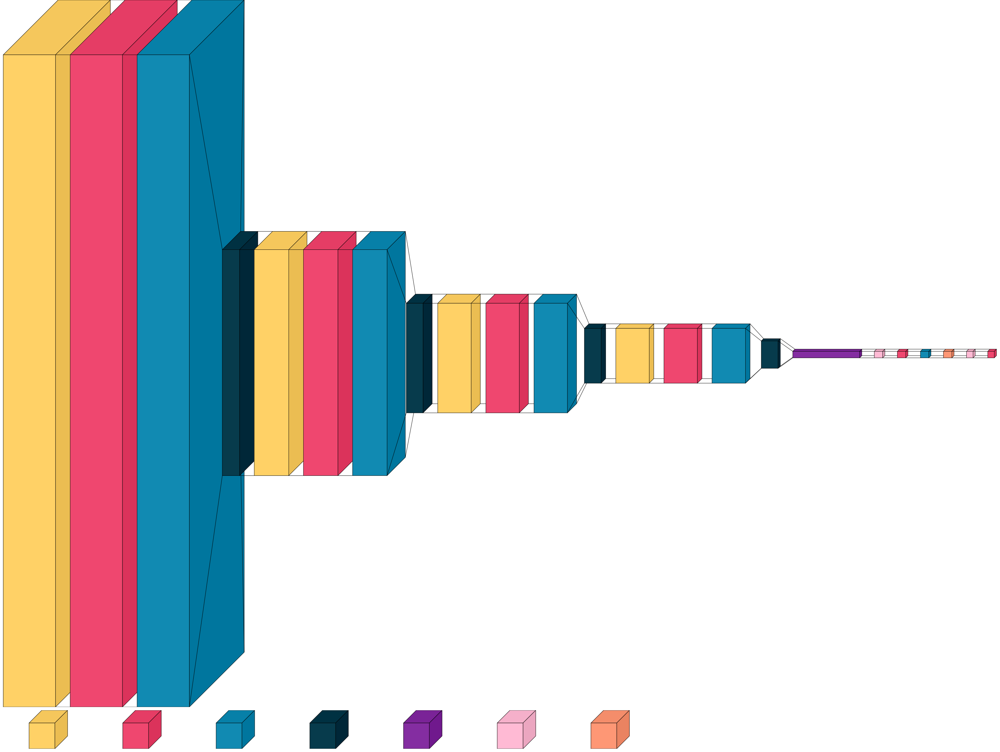

In [28]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


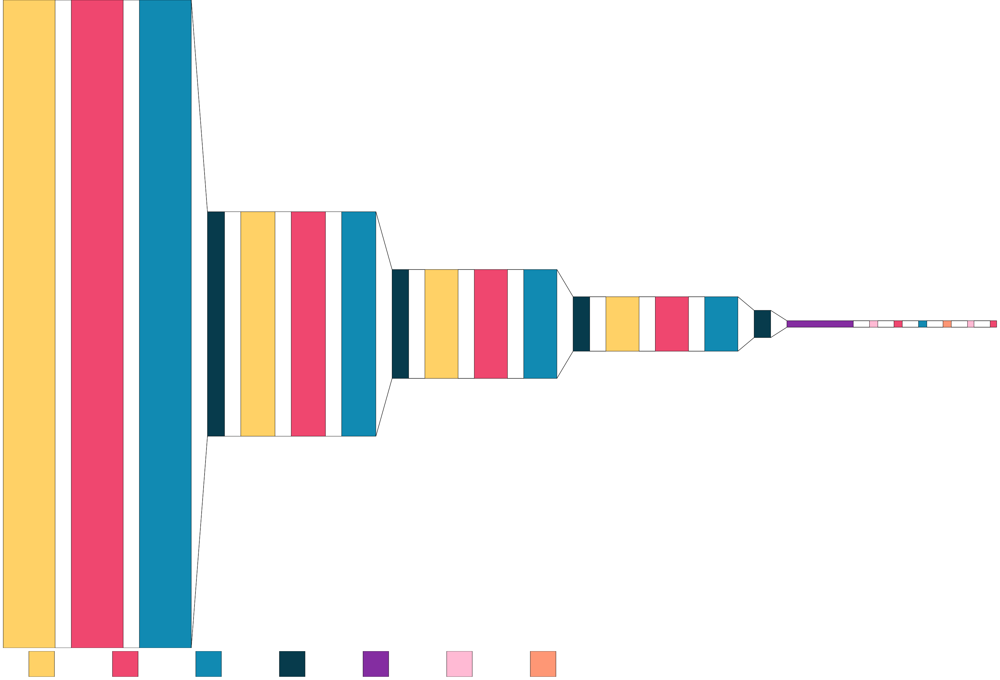

In [29]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

In [30]:
# Model with image size 120x120
 
num_frames    = 24
frame_height  = 120
frame_width   = 120
size_batch    = 32
num_epochs    = 2
augment       = False
normalize     = True

model = model_Conv3D_Test(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
trainer(model, 'Conv3D_Test', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_4 (Conv3D)           (None, 24, 120, 120, 16)  1312      
                                                                 
 activation_6 (Activation)   (None, 24, 120, 120, 16)  0         
                                                                 
 batch_normalization_5 (Batc  (None, 24, 120, 120, 16)  64       
 hNormalization)                                                 
                                                                 
 max_pooling3d_4 (MaxPooling  (None, 8, 40, 40, 16)    0         
 3D)                                                             
                                                                 
 conv3d_5 (Conv3D)           (None, 8, 40, 40, 32)     4128      
                                                                 
 activation_7 (Activation)   (None, 8, 40, 40, 32)    

Model in  diagram in 3D


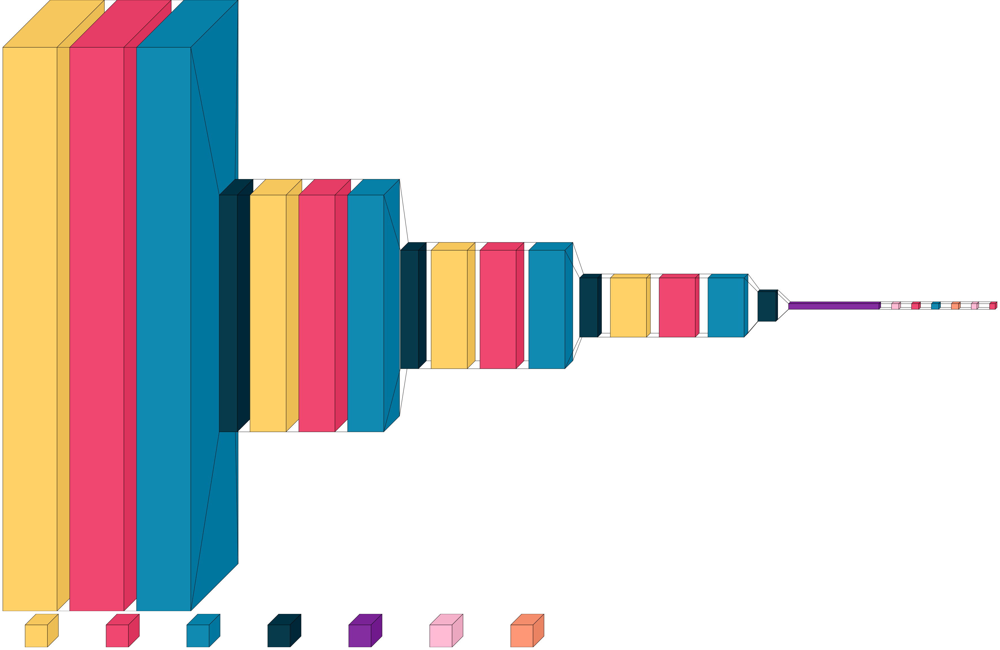

In [31]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


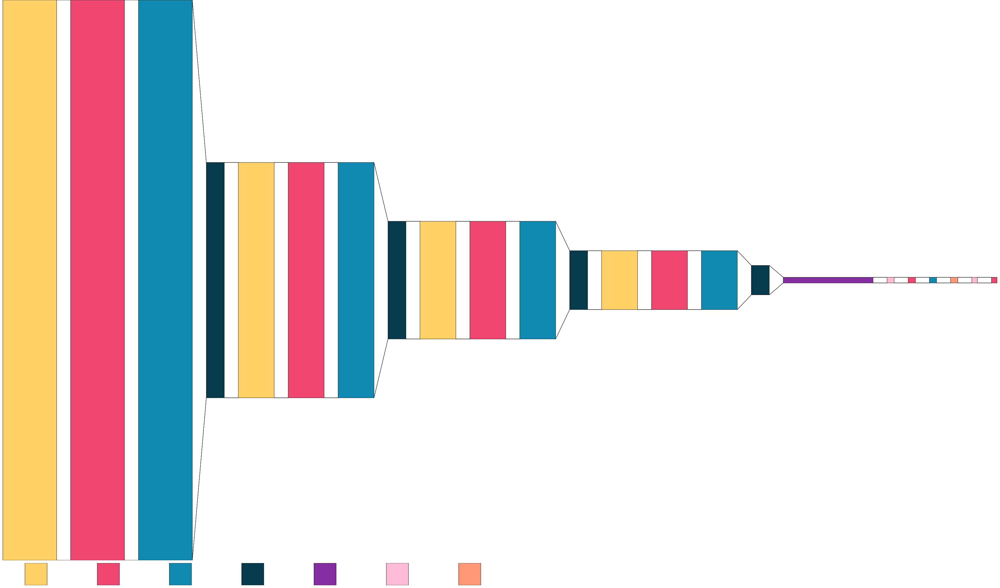

In [32]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

In [33]:
# # Model with image size 160x160
 
num_frames    = 24
frame_height  = 160
frame_width   = 160
size_batch    = 32
num_epochs    = 2
augment       = False
normalize     = True  # Diving image channel wise by 255 taken care in Generator function

model = model_Conv3D_Test(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# # Run the model and check accuracy
trainer(model, 'Conv3D_Test', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_8 (Conv3D)           (None, 24, 160, 160, 16)  1312      
                                                                 
 activation_12 (Activation)  (None, 24, 160, 160, 16)  0         
                                                                 
 batch_normalization_10 (Bat  (None, 24, 160, 160, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_8 (MaxPooling  (None, 8, 53, 53, 16)    0         
 3D)                                                             
                                                                 
 conv3d_9 (Conv3D)           (None, 8, 53, 53, 32)     4128      
                                                                 
 activation_13 (Activation)  (None, 8, 53, 53, 32)    

Model in  diagram in 3D


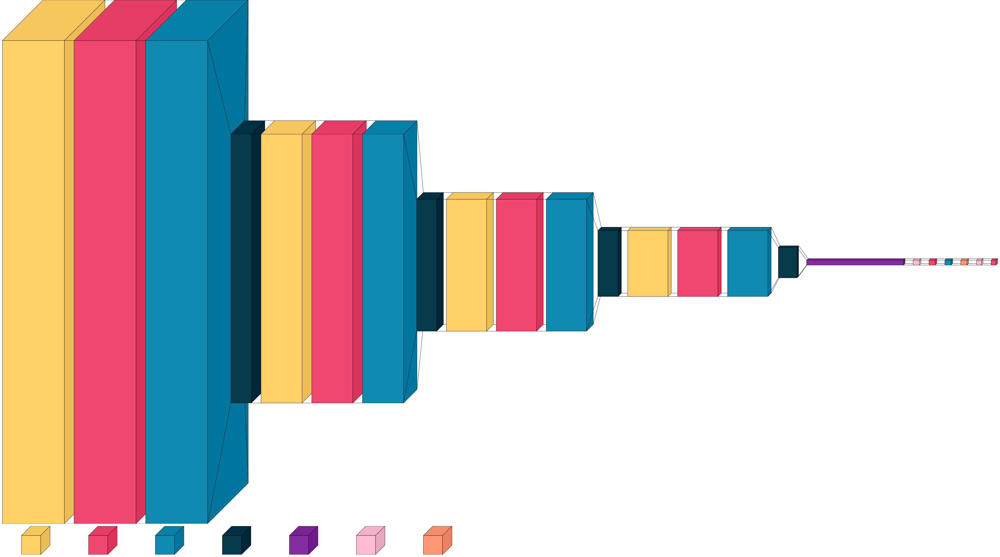

In [34]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=40, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


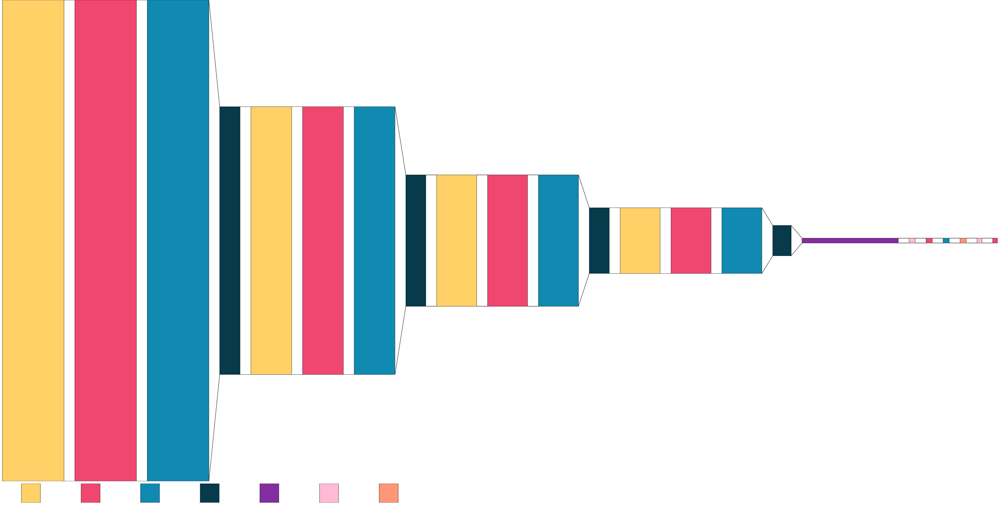

In [35]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, draw_volume=False, scale_xy=21)

## <font >Observations:</font>

- <font >Using images with a size of 160x160 may lead to OOM (Out of Memory) errors with higher frame counts. In contrast, a 120x120 size appears more efficient, as it requires less time while maintaining good accuracy. This size strikes a good balance between time and accuracy and allows for a higher batch size. We will begin with this batch size but will also evaluate the 100x100 size in some models.</font>


####  <font >Choose number of frames</font>

- We determined that a single image is enough to recognize gestures such as Thumbs Up, Thumbs Down, or Stop. For Left and Right Swipes, a maximum of two images is required. Therefore, instead of utilizing all 30 frames, we opted to use either 16 or 20 frames.
- This approach not only helps prevent overfitting but also ensures a more manageable and efficient process.

<font >As these parameters are decided let us start building the model and decide on other parameters such as filter size, layers etc</font>


## <font > Model Architecture 1 - Conv3D model with filter size (3,3,3)</font>

- <font >'model_Conv3D_1' serves as a baseline Conv3D architecture for video classification tasks, particularly suited for recognizing gestures within video sequences.</font>
- <font >The model is designed to strike a balance between complexity and performance, and it can be further refined and customized based on specific requirements and experimentation.</font>

In [36]:
def model_Conv3D_1(num_frames, frame_height, frame_width):

    model = Sequential()
    model.add(Conv3D(16, (3,3,3), 
                     input_shape = (num_frames, frame_height, frame_width, 3),     
                     padding = 'same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2,2,2)))
    
    model.add(Conv3D(32, (3,3,3), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(64, (3,3,3), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(128, (3,3,3), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))

    model.add(Flatten())

    model.add(Dense(128))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    
    model.add(Dense(256))
    model.add(Activation('relu'))
    model.add(Dropout(0.25))
    
    # Final softmax layer for the 5 classes
    model.add(Dense(5))
    model.add(Activation('softmax'))
    
    return model

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_12 (Conv3D)          (None, 16, 120, 120, 16)  1312      
                                                                 
 activation_18 (Activation)  (None, 16, 120, 120, 16)  0         
                                                                 
 batch_normalization_15 (Bat  (None, 16, 120, 120, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_12 (MaxPoolin  (None, 8, 60, 60, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_13 (Conv3D)          (None, 8, 60, 60, 32)     13856     
                                                                 
 activation_19 (Activation)  (None, 8, 60, 60, 32)    

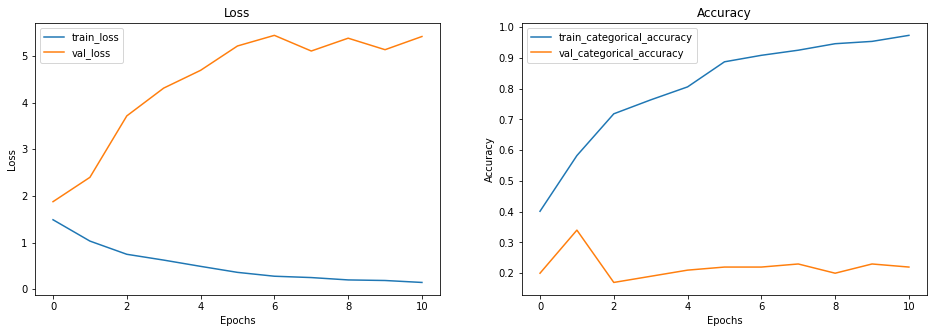

In [37]:
# Model 1 - Conv3D Model with filter size (3,3,3)

frame_height    = 120
frame_width     = 120
num_frames      = 16
size_batch      = 32
num_epochs      = 20
augment         = False
normalize       = True

model = model_Conv3D_1(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_1', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)
modelplot(model_history)


Model in  diagram in 3D


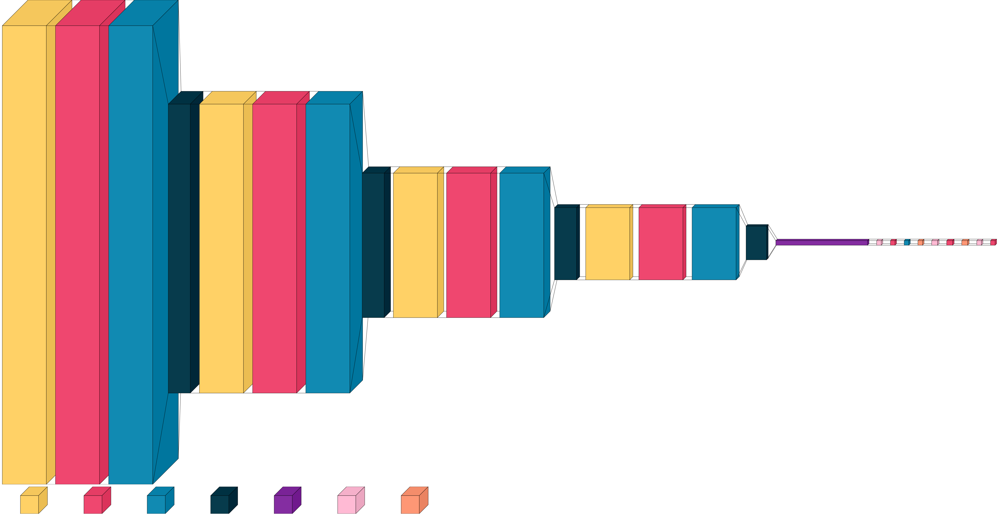

In [38]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=40, legend=True, font=font, scale_xy=21, legend_text_spacing_offset=60)

Model in  diagram in 2D


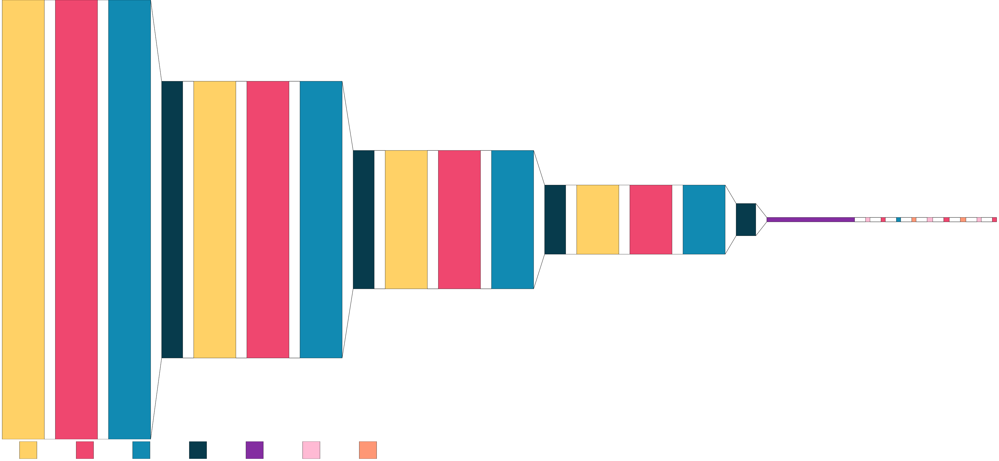

In [39]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

In [40]:
retain_best_model(model_history, "Conv3D_1_2024-07-2806_38_44.434590", 'Conv3D_1')

+--------------------------------------------+---------------------+
| Metric                                     | Value               |
+============================================+=====================+
| Model Name                                 | Conv3D_1            |
+--------------------------------------------+---------------------+
| Best Epoch                                 | 11                  |
+--------------------------------------------+---------------------+
| Index For Best Model Loss                  | 10                  |
+--------------------------------------------+---------------------+
| Best Model Loss                            | 0.14610175788402557 |
+--------------------------------------------+---------------------+
| Best Model Categorical Accuracy            | 0.9728506803512573  |
+--------------------------------------------+---------------------+
| Best Model Validation Categorical Accuracy | 0.2199999988079071  |
+---------------------------------

## <font >Observation:</font>


<font >- Looks like Model 1 is experiencing <strong>overfitting</strong>. To tackle this issue, we should investigate/ experiment whether modifying the kernel size to (2,2,2) can help alleviate the overfitting problem.

 
 

###  <font >Model Architecture 2 - Conv3D model with filter size (2,2,2)</font>

- <font >The 'model_Conv3D_2' experiment aims to tackle overfitting by adjusting the filter size in the Conv3D layers. The effectiveness of this change can be evaluated through model training and comparison with the previous architecture. We need to experiment further to fine-tune the model for optimal results.</font>


In [ ]:
# Model 2 - Conv3D Model with filter size (2,2,2)
def model_Conv3D_2(num_frames, frame_height, frame_width):

    model = Sequential()
    model.add(Conv3D(16, (2,2,2), 
                     input_shape = (num_frames, frame_height, frame_width, 3),     
                     padding = 'same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2,2,2)))
    
    model.add(Conv3D(32, (2, 2, 2), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(64, (2, 2, 2), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(128, (2, 2, 2), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))

    model.add(Flatten())

    model.add(Dense(128))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    
    model.add(Dense(256))
    model.add(Activation('relu'))
    model.add(Dropout(0.25))
    
    # Final softmax layer for the 5 classes
    model.add(Dense(5))
    model.add(Activation('softmax'))
    
    return model

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_16 (Conv3D)          (None, 16, 120, 120, 16)  400       
                                                                 
 activation_25 (Activation)  (None, 16, 120, 120, 16)  0         
                                                                 
 batch_normalization_20 (Bat  (None, 16, 120, 120, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_16 (MaxPoolin  (None, 8, 60, 60, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_17 (Conv3D)          (None, 8, 60, 60, 32)     4128      
                                                                 
 activation_26 (Activation)  (None, 8, 60, 60, 32)    

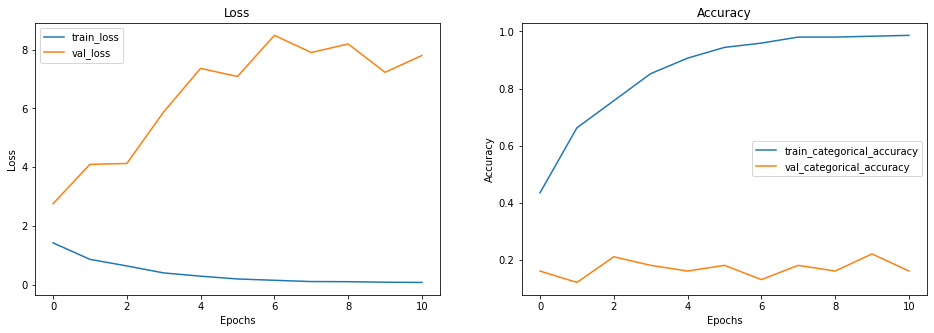

In [ ]:
# Model 2 - Conv3D Model with filter size (2,2,2)

frame_height    = 120
frame_width     = 120
num_frames      = 16
size_batch      = 32
num_epochs      = 20
augment         = False
normalization   = True

model = model_Conv3D_2(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_2', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalization)
modelplot(model_history)


- Best Model Categorical Accuracy            | 98.64% 
- Best Model Validation Categorical Accuracy | 15.99%

Model in  diagram in 3D


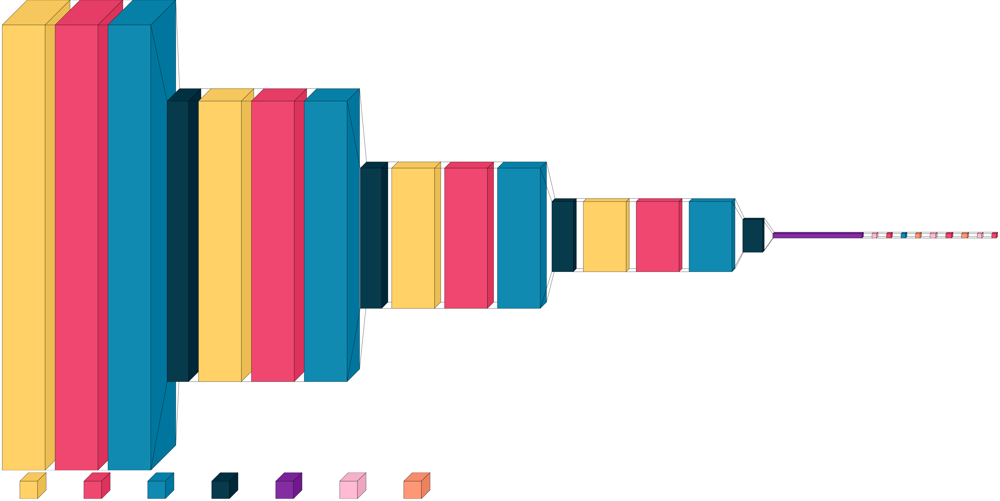

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


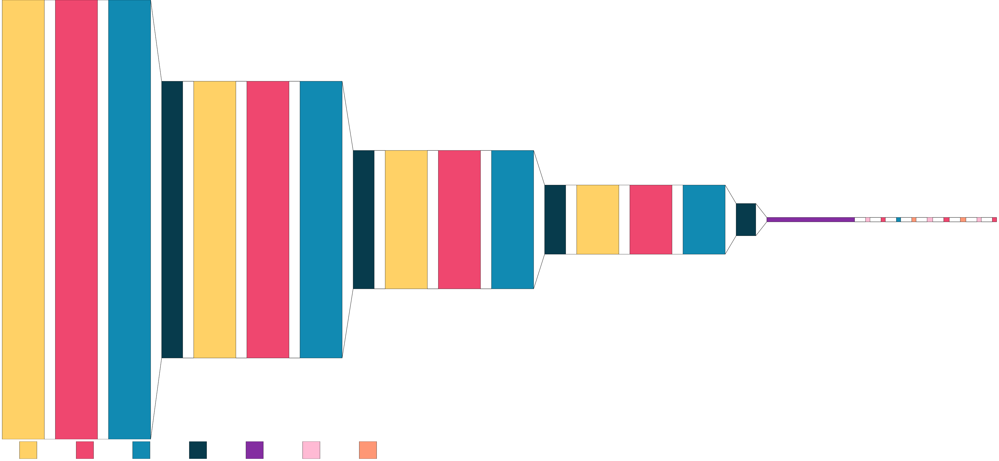

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation:</font>
- <font >Looks like Model 2 is still experiencing <strong>overfitting</strong>. To address this issue, let's explore applying toggles for Augmentation and Normalization.</font>

###  <font > Model Architecture 3 - Conv3D model with filter size (3,3,3) and Augmentation</font>

- <font >The 'model_Conv3D_3' experiment aims to evaluate the impact of larger filter sizes in Conv3D layers on model performance, especially in mitigating overfitting. The model's effectiveness can be assessed through training and testing, with further adjustments considered based on the results.</font>


In [ ]:
# Model 3 - Conv3D Model with filter size (3,3,3)
def model_Conv3D_3(num_frames, frame_height, frame_width):

    model = Sequential()
    model.add(Conv3D(16, (3,3,3), 
                     input_shape = (num_frames, frame_height, frame_width, 3),     
                     padding = 'same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2,2,2)))
    
    model.add(Conv3D(32, (3,3,3), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(64, (3,3,3), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))
    
    model.add(Conv3D(128, (3,3,3), padding='same'))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(2, 2, 2)))

    model.add(Flatten())

    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    
    model.add(Dense(128))
    model.add(Activation('relu'))
    model.add(Dropout(0.25))
    
    # Final softmax layer for the 5 classes
    model.add(Dense(5))
    model.add(Activation('softmax'))
    
    return model

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_20 (Conv3D)          (None, 16, 120, 120, 16)  1312      
                                                                 
 activation_32 (Activation)  (None, 16, 120, 120, 16)  0         
                                                                 
 batch_normalization_25 (Bat  (None, 16, 120, 120, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_20 (MaxPoolin  (None, 8, 60, 60, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_21 (Conv3D)          (None, 8, 60, 60, 32)     13856     
                                                                 
 activation_33 (Activation)  (None, 8, 60, 60, 32)    

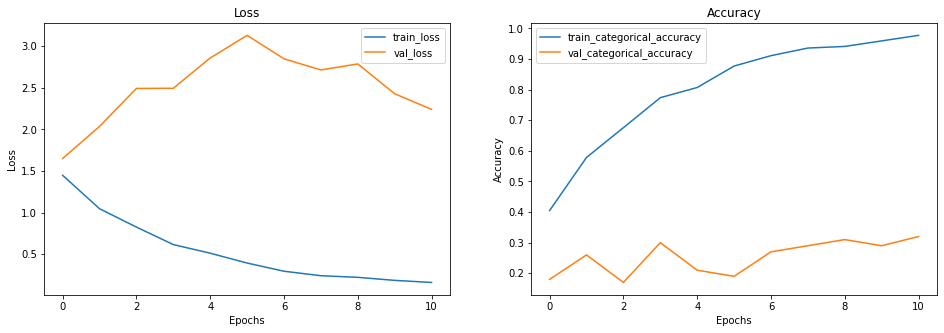

In [ ]:
# Model 3 - Conv3D Model with filter size (3,3,3)

frame_height    = 120
frame_width     = 120
num_frames      = 16
size_batch      = 32
num_epochs      = 20
augment         = True
normalization   = True

model = model_Conv3D_3(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_3_1', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalization)
modelplot(model_history)

- Best Model Categorical Accuracy            | 97.73% 
- Best Model Validation Categorical Accuracy | 31.99%

Model in  diagram in 3D


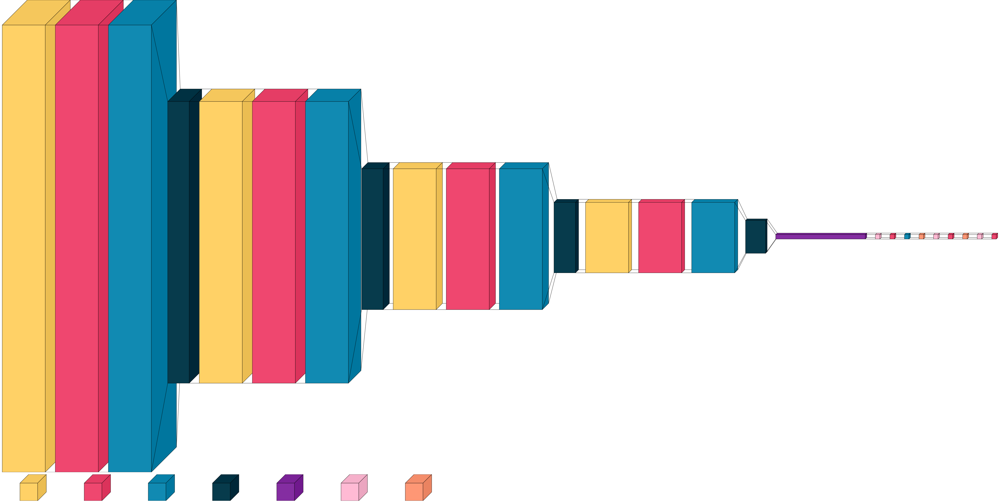

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


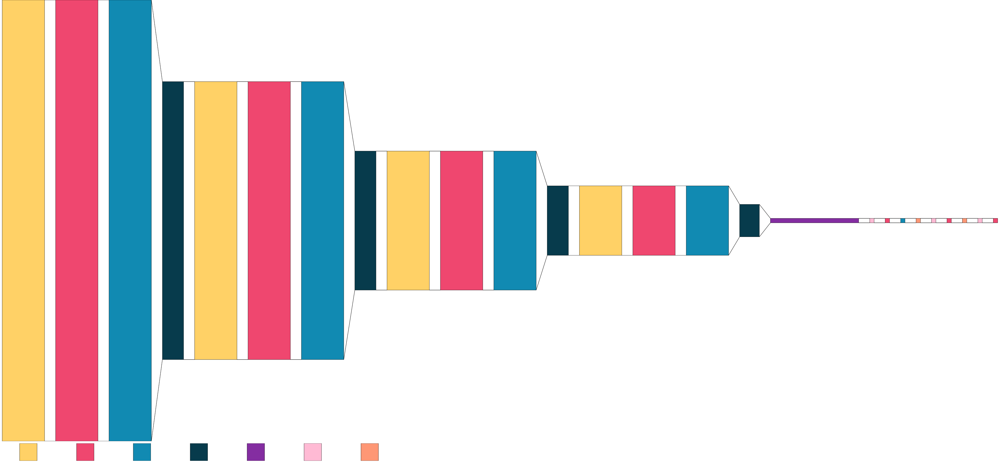

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>

- <font >The model mentioned above also suffers from overfitting.</font>


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_24 (Conv3D)          (None, 16, 120, 120, 16)  1312      
                                                                 
 activation_39 (Activation)  (None, 16, 120, 120, 16)  0         
                                                                 
 batch_normalization_30 (Bat  (None, 16, 120, 120, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_24 (MaxPoolin  (None, 8, 60, 60, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_25 (Conv3D)          (None, 8, 60, 60, 32)     13856     
                                                                 
 activation_40 (Activation)  (None, 8, 60, 60, 32)    

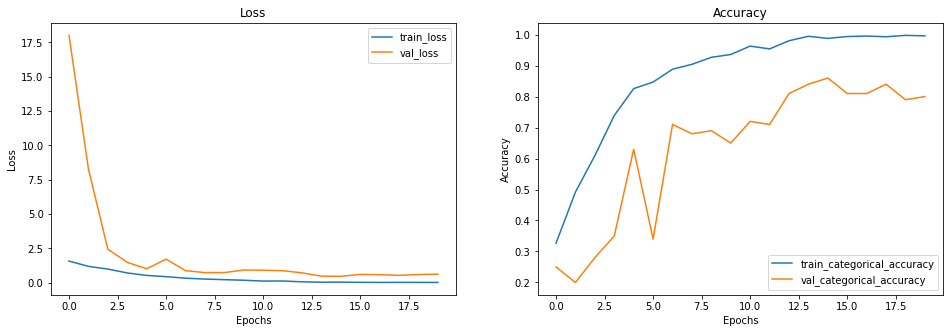

In [ ]:
# Model 4 - Conv3D Model with filter size (3,3,3) without Normalization

frame_height    = 120
frame_width     = 120
num_frames      = 16
size_batch      = 32
num_epochs      = 20
augment         = True
normalization   = False

model = model_Conv3D_3(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_3_2', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalization)
modelplot(model_history)


Model in  diagram in 3D


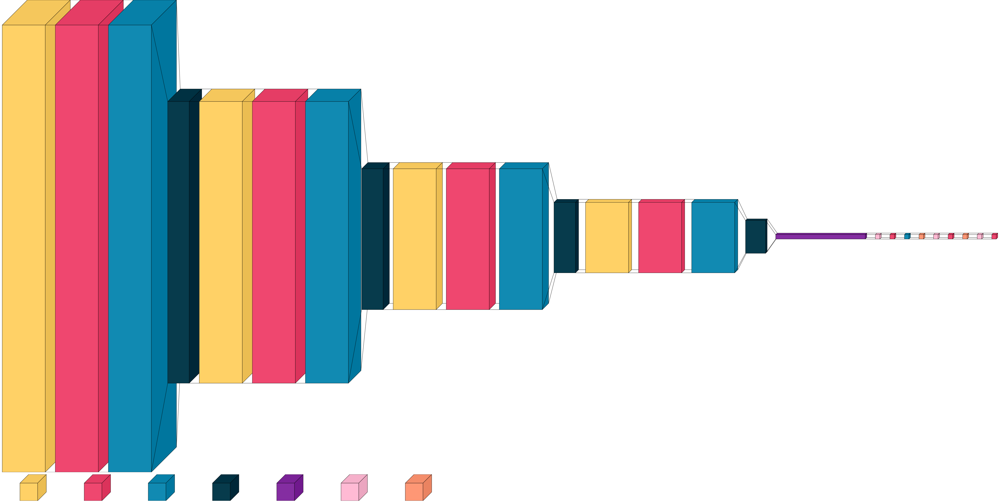

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


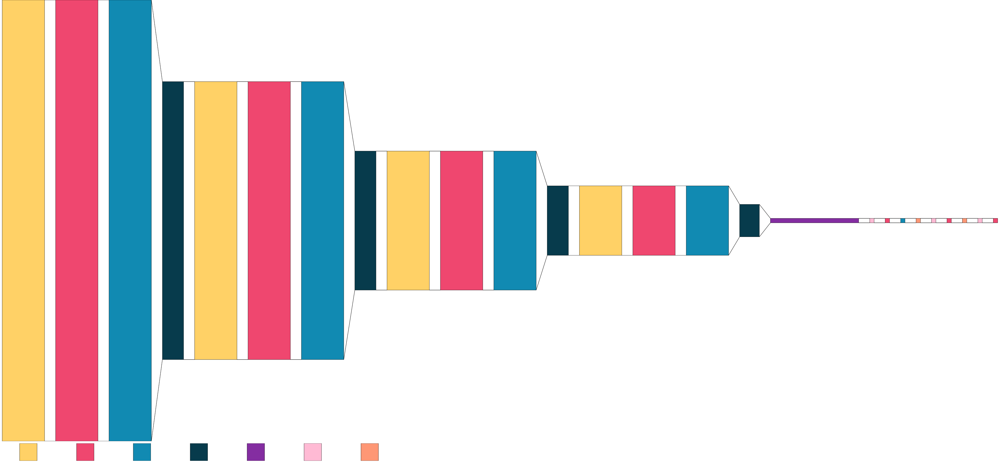

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>
- So far, Model 4 - Conv3D with a filter size of (3,3,3), without normalization but with augmentation, has performed the best.-   It achieved a training accuracy of 99% and a validation accuracy of 86
- The model uses the Adam optimizer and has 700k parameters.
-  Let's explore further to see if we can improve this performance.


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_28 (Conv3D)          (None, 16, 120, 120, 16)  1312      
                                                                 
 activation_46 (Activation)  (None, 16, 120, 120, 16)  0         
                                                                 
 batch_normalization_35 (Bat  (None, 16, 120, 120, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_28 (MaxPoolin  (None, 8, 60, 60, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_29 (Conv3D)          (None, 8, 60, 60, 32)     13856     
                                                                 
 activation_47 (Activation)  (None, 8, 60, 60, 32)    

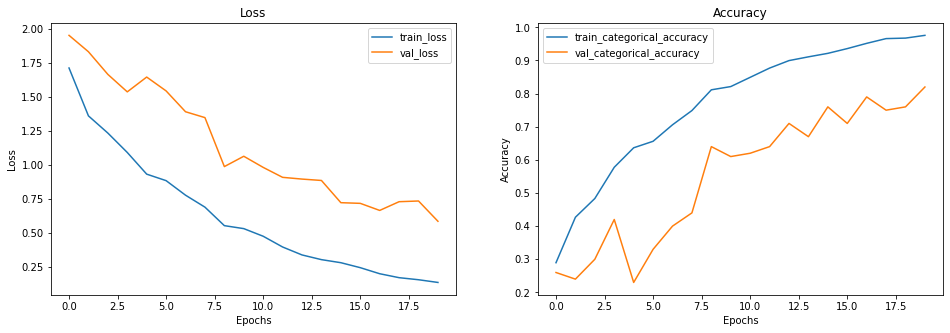

In [ ]:
# Model 5 - Conv3D Model with filter size (3,3,3) 
# This model is same as above but with SGD Optimizer
frame_height    = 120
frame_width     = 120
num_frames      = 16
size_batch      = 32
num_epochs      = 20
augment         = True
normalization   = False

model = model_Conv3D_3(num_frames, frame_height, frame_width)
optimiser = 'sgd'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_3_3', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalization)
modelplot(model_history)



Model in  diagram in 3D


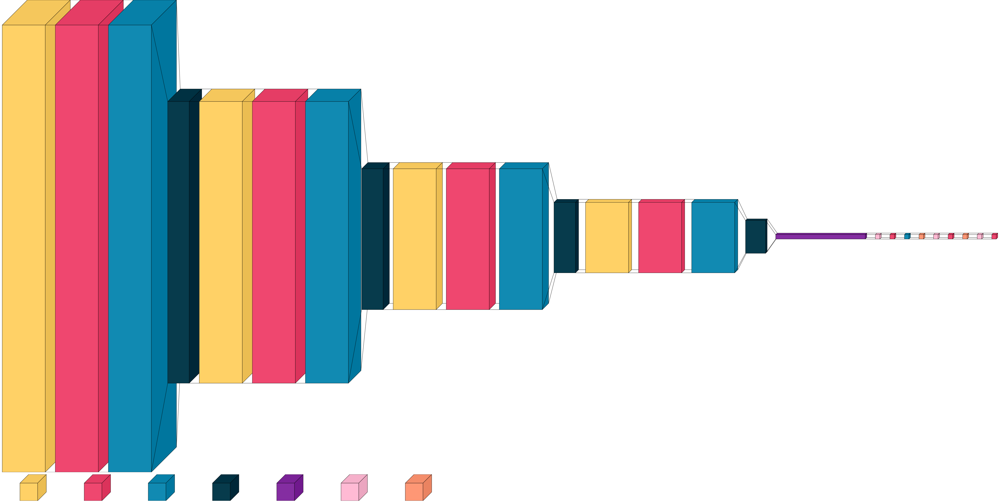

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


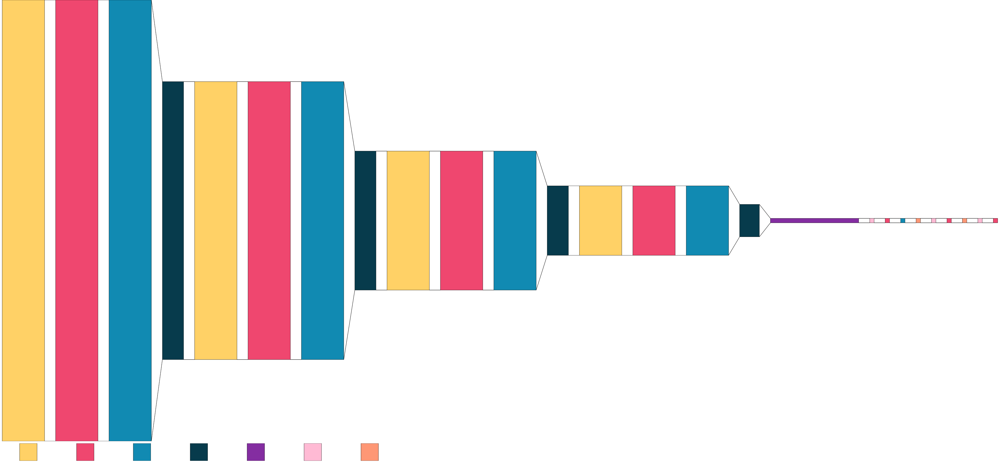

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

#### Observation(s):
- Categorical accuracy: 97.5%-   Validation categorical accuracy: 82%
- Parameter size: 700k
-  This model, using the SGD optimizer, is almost identical to the previous model that used the Adam optimizer.mizer.

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_32 (Conv3D)          (None, 16, 100, 100, 16)  1312      
                                                                 
 activation_53 (Activation)  (None, 16, 100, 100, 16)  0         
                                                                 
 batch_normalization_40 (Bat  (None, 16, 100, 100, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_32 (MaxPoolin  (None, 8, 50, 50, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_33 (Conv3D)          (None, 8, 50, 50, 32)     13856     
                                                                 
 activation_54 (Activation)  (None, 8, 50, 50, 32)    

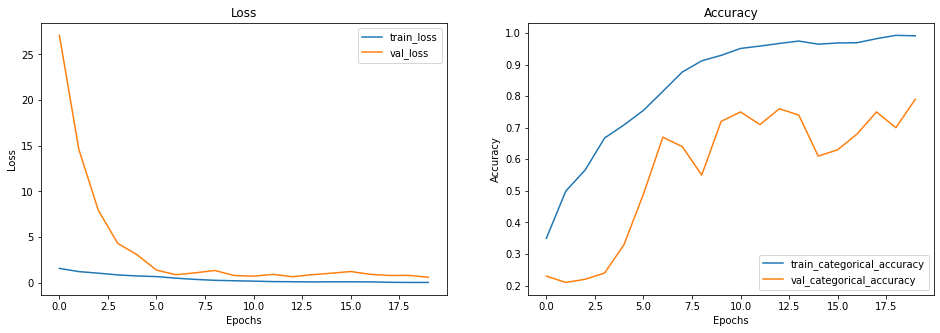

In [ ]:
# Model 6 - Conv3D Model with filter size (3,3,3) with augmentation without Normalization and with Framesize 100x100

frame_height    = 100
frame_width     = 100
num_frames      = 16
size_batch      = 32
num_epochs      = 20
augment         = True
normalization   = False

model = model_Conv3D_3(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_3_4', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalization)
modelplot(model_history)


- Best Model Categorical Accuracy            | 99.24% 
- Best Model Validation Categorical Accuracy | 69.99%

Model in  diagram in 3D


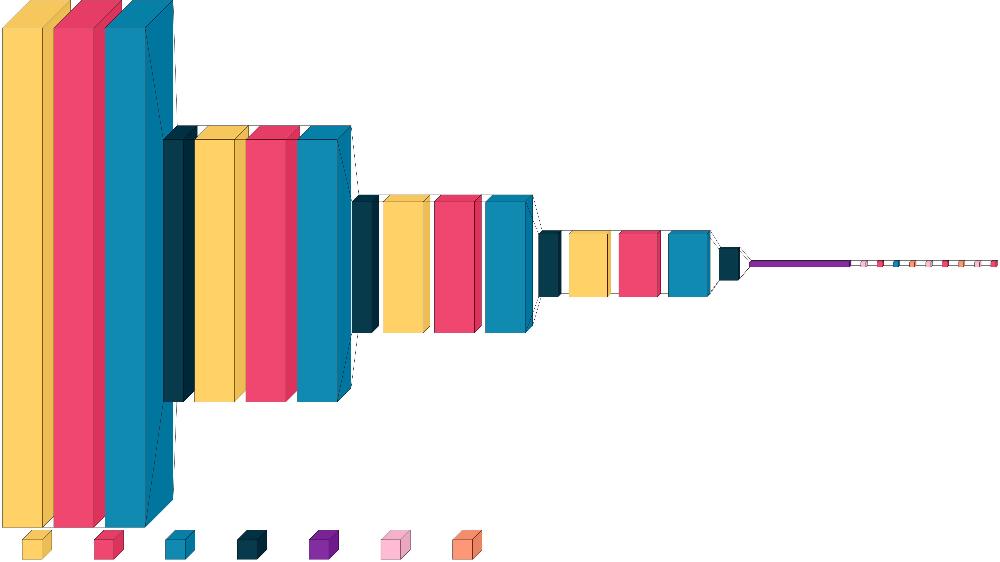

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


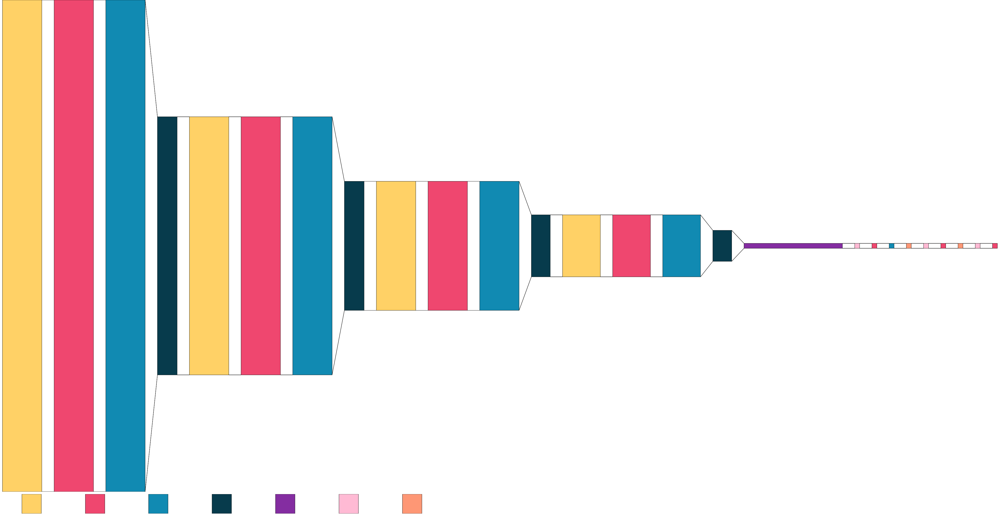

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>
- Categorical accuracy: 0.99
- Validation categorical accuracy: 0.69
- Frame size: 100x100

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_36 (Conv3D)          (None, 16, 100, 100, 16)  1312      
                                                                 
 activation_60 (Activation)  (None, 16, 100, 100, 16)  0         
                                                                 
 batch_normalization_45 (Bat  (None, 16, 100, 100, 16)  64       
 chNormalization)                                                
                                                                 
 max_pooling3d_36 (MaxPoolin  (None, 8, 50, 50, 16)    0         
 g3D)                                                            
                                                                 
 conv3d_37 (Conv3D)          (None, 8, 50, 50, 32)     13856     
                                                                 
 activation_61 (Activation)  (None, 8, 50, 50, 32)    

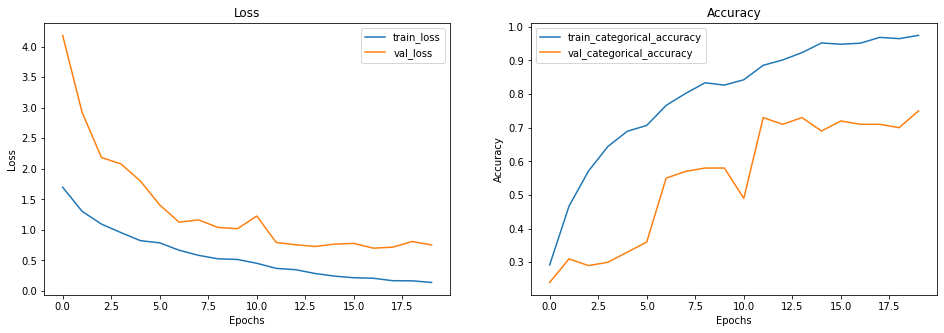

In [ ]:
# Model 7 - Conv3D Model with filter size (3,3,3) with augmentation without Normalization and with Framesize 100x100 and SGD Optimizer

frame_height    = 100
frame_width     = 100
num_frames      = 16
size_batch      = 32
num_epochs      = 20
augment         = True
normalization   = False

model = model_Conv3D_3(num_frames, frame_height, frame_width)
optimiser = 'sgd'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_3_5', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalization)
modelplot(model_history)


- Best Model Categorical Accuracy            | 97.43% 
- Best Model Validation Categorical Accuracy | 75%

Model in  diagram in 3D


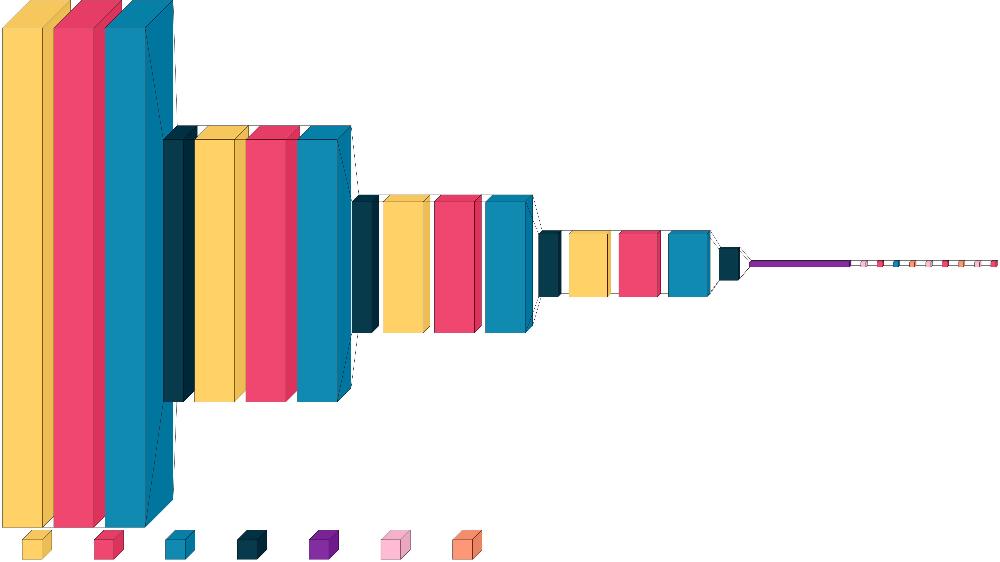

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


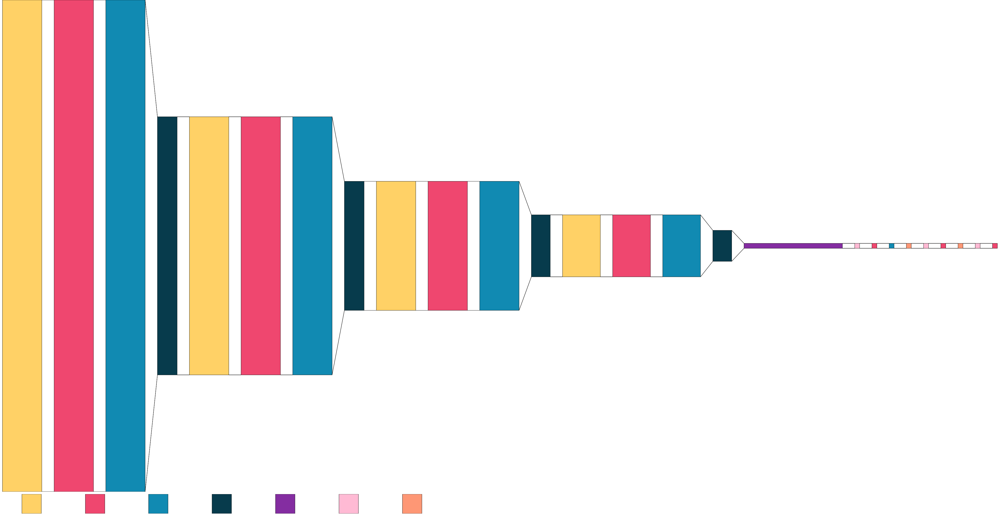

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>
- <font >categorical_accuracy: 97%</font>
- <font >val_categorical_accuracy: 75%</font>
- <font >SGD Optimizer</font>

### <font >Model Architecture 4 - Conv3D model with filter size (3,3,3) and 4 Conv3D layers and two Dense layers</font>


In [ ]:
# Model Architecture 4 - Conv3D Model with filter size (3,3,3)
# Conv3D Filters 8, 16, 32, 64 followed by Dense layers in descending order of 512, 64 and finally 5
# Batch Normalization and Dropouts are also used
def model_Conv3D_4(num_frames, frame_height, frame_width):

    # Define model
    model = Sequential()

    model.add(Conv3D(8, 
                    kernel_size=(3,3,3), 
                    input_shape=(num_frames, frame_height, frame_width,3),
                    padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    model.add(MaxPooling3D(pool_size=(2,2,2)))

    model.add(Conv3D(16, 
                    kernel_size=(3,3,3), 
                    padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    model.add(MaxPooling3D(pool_size=(2,2,2)))

    model.add(Conv3D(32, 
                    kernel_size=(1,3,3), 
                    padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    model.add(MaxPooling3D(pool_size=(2,2,2)))

    model.add(Conv3D(64, 
                    kernel_size=(1,3,3), 
                    padding='same'))
    model.add(Activation('relu'))
    model.add(Dropout(0.25))

    model.add(MaxPooling3D(pool_size=(2,2,2)))

    #Flatten Layers
    model.add(Flatten())

    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))

    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))

    #softmax layer
    model.add(Dense(5, activation='softmax'))

    return model

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_40 (Conv3D)          (None, 20, 120, 120, 8)   656       
                                                                 
 batch_normalization_50 (Bat  (None, 20, 120, 120, 8)  32        
 chNormalization)                                                
                                                                 
 activation_67 (Activation)  (None, 20, 120, 120, 8)   0         
                                                                 
 max_pooling3d_40 (MaxPoolin  (None, 10, 60, 60, 8)    0         
 g3D)                                                            
                                                                 
 conv3d_41 (Conv3D)          (None, 10, 60, 60, 16)    3472      
                                                                 
 batch_normalization_51 (Bat  (None, 10, 60, 60, 16) 

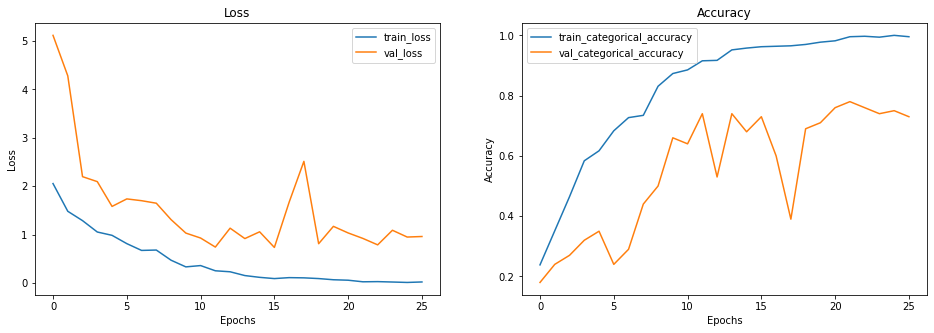

In [ ]:
# Model 8 - Conv3D Model with filter size (3,3,3) with augmentation without Normalization and with Framesize 120X120

frame_height    = 120
frame_width     = 120
num_frames      = 20
size_batch      = 32
num_epochs      = 30
augment         = False
normalization   = False

model = model_Conv3D_4(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_4_1', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalization)
modelplot(model_history)


- Best Model Categorical Accuracy            | 99% 
- Best Model Validation Categorical Accuracy | 78%

Model in  diagram in 3D


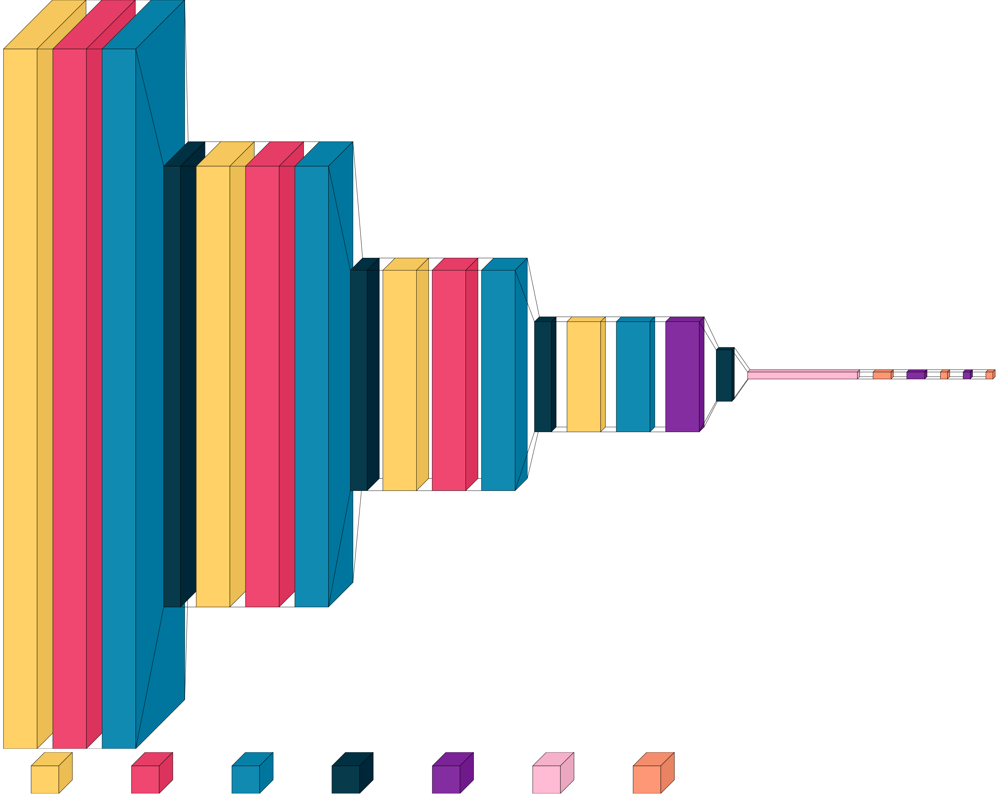

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


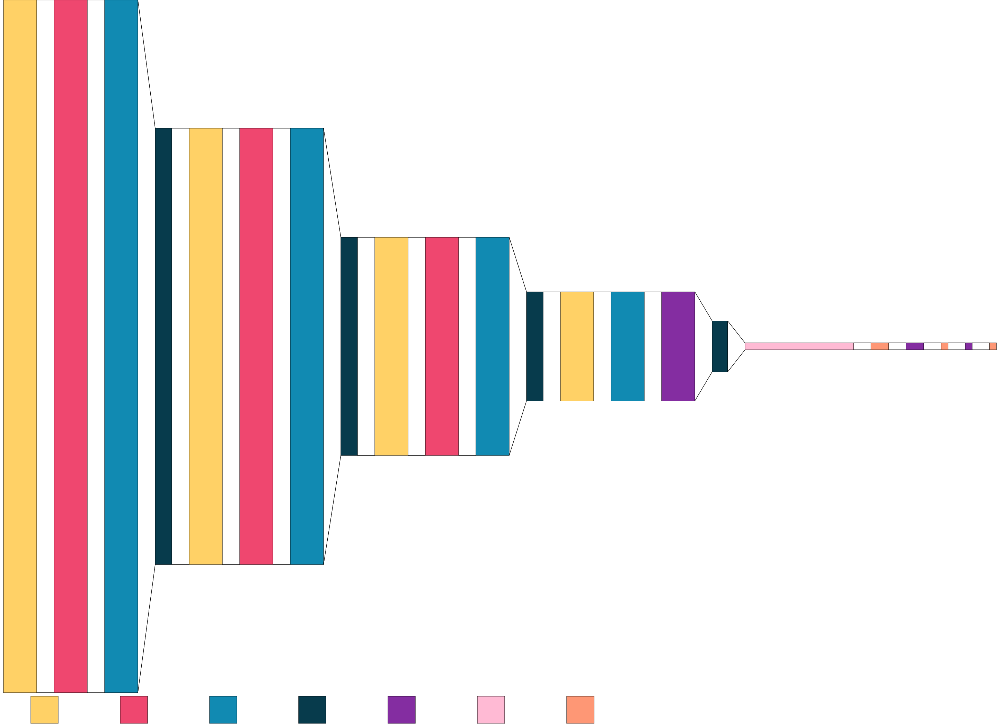

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>
 
- <font > Still overfitting with Train Accuracy</font>
- <font >Train accuracy is 99%</font>
- <font > Validation accuracy is 78%</font>


### <font > Model Architecture 5 -  Conv3D model with filter size (3,3,3) and Leaky ReLU</font>

- <font >Let's enhance the Conv3D model with a filter size of (3,3,3) by slightly modifying the architecture and adding a Dense layer with 512 units.</font>


In [ ]:
# Conv3D Model with filter size (3,3,3)
def model_Conv3D_5(num_frames, frame_height, frame_width):

    model = Sequential()
    model.add(Conv3D(32,(3,3,3), strides=(1,1,1), 
              input_shape = (num_frames, frame_height, frame_width, 3),
              padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.1))
    model.add(MaxPooling3D(pool_size=(2,2,1),strides=(2,2,1)))

    model.add(Conv3D(64, (3,3,3), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.1))

    model.add(Conv3D(64, (3,3, 3)))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.1))
    model.add(MaxPooling3D(pool_size=(2,2,2)))
    model.add(Dropout(0.25)) # Dropout 0.5

    model.add(Flatten())
    model.add(Dropout(0.25)) # Dropout 0.25
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.1))
# Final softmax layer for the 5 classes
    model.add(Dense(5))
    model.add(Activation('softmax'))
    return model


Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_44 (Conv3D)          (None, 15, 100, 100, 32)  2624      
                                                                 
 batch_normalization_53 (Bat  (None, 15, 100, 100, 32)  128      
 chNormalization)                                                
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 15, 100, 100, 32)  0         
                                                                 
 max_pooling3d_44 (MaxPoolin  (None, 7, 50, 100, 32)   0         
 g3D)                                                            
                                                                 
 conv3d_45 (Conv3D)          (None, 7, 50, 100, 64)    55360     
                                                                 
 batch_normalization_54 (Bat  (None, 7, 50, 100, 64) 

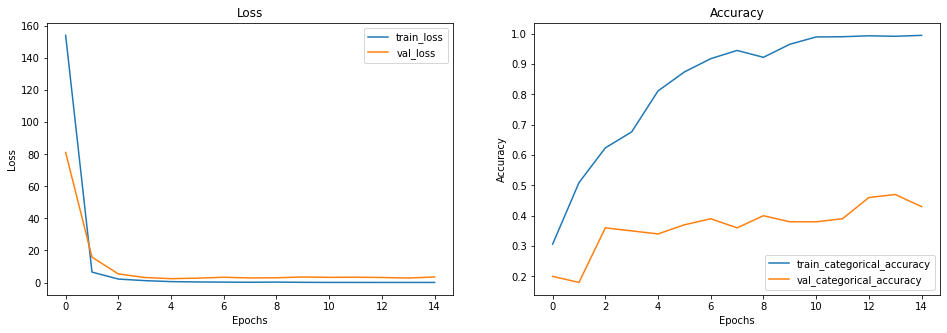

In [ ]:
# Model 9 - Conv3D Model with filter size (3,3,3)
frame_height    = 100
frame_width     = 100
num_frames      = 15
size_batch      = 32
num_epochs      = 30
augment         = True
normalize       = True


model = model_Conv3D_5(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_5_1', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)
modelplot(model_history)


- Best Model Categorical Accuracy            | 99.47% 
- Best Model Validation Categorical Accuracy | 43%

Model in  diagram in 3D


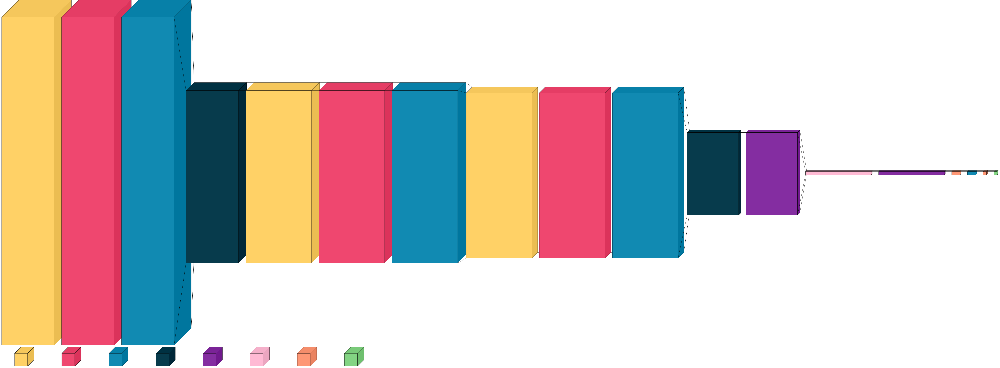

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


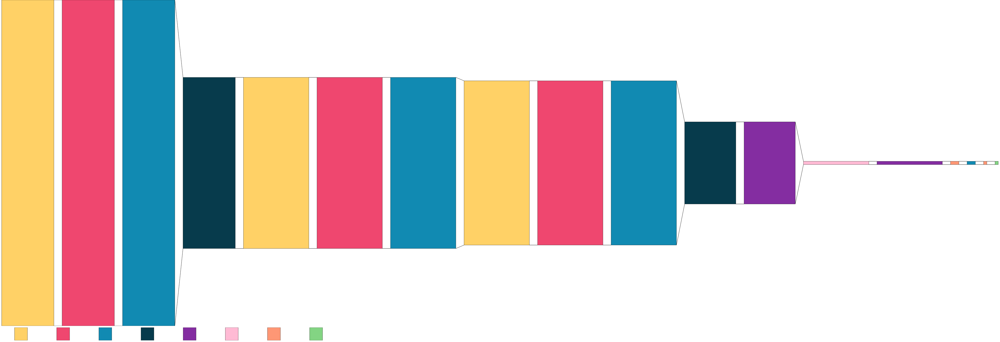

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>

- <font >The above model is still over-fitting</font>
- <font >Best Model Categorical Accuracy 99%</font>
- <font >Best Model Validation Categorical Accuracy 43%</font>

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_50 (Conv3D)          (None, 15, 100, 100, 32)  2624      
                                                                 
 batch_normalization_59 (Bat  (None, 15, 100, 100, 32)  128      
 chNormalization)                                                
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 15, 100, 100, 32)  0         
                                                                 
 max_pooling3d_48 (MaxPoolin  (None, 7, 50, 100, 32)   0         
 g3D)                                                            
                                                                 
 conv3d_51 (Conv3D)          (None, 7, 50, 100, 64)    55360     
                                                                 
 batch_normalization_60 (Bat  (None, 7, 50, 100, 64) 

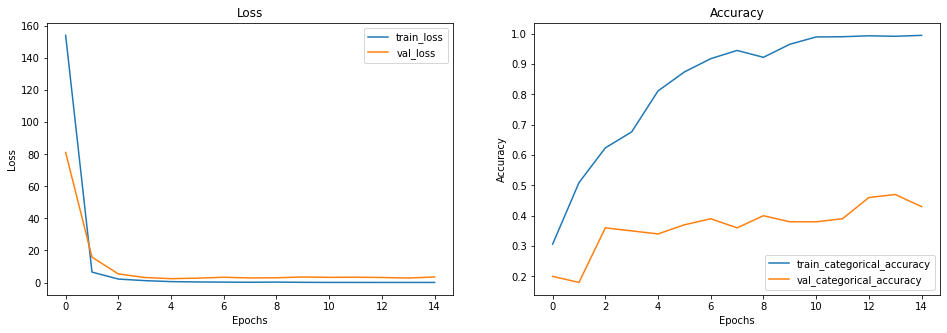

In [70]:
# Model 10 - Conv3D Model with filter size (3,3,3)
# Same as above model without augmentation
# Optimizer - SGD
frame_height    = 100
frame_width     = 100
num_frames      = 15
size_batch      = 20
num_epochs      = 30
augment         = False
normalize       = True

model = model_Conv3D_5(num_frames, frame_height, frame_width)
optimiser = 'sgd'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
pmodel_history = trainer(model, 'Conv3D_5_2', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)
modelplot(model_history)


- Best Model Categorical Accuracy            | 99%            
- Best Model Validation Categorical Accuracy | 63.99%

Model in  diagram in 3D


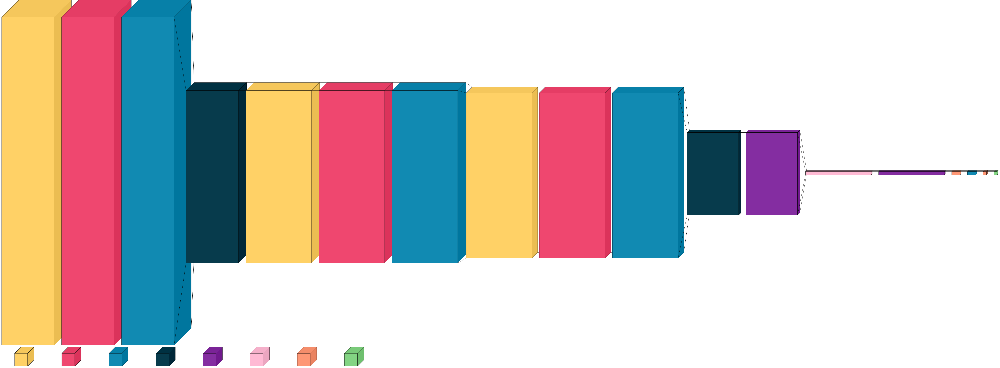

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


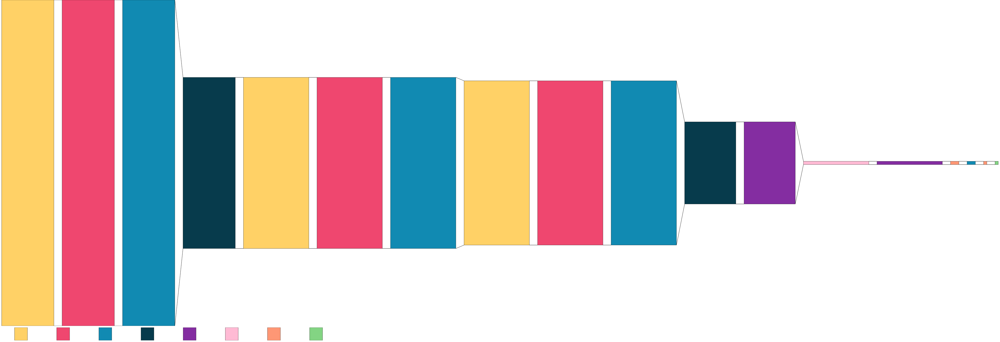

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_53 (Conv3D)          (None, 15, 100, 100, 32)  2624      
                                                                 
 batch_normalization_62 (Bat  (None, 15, 100, 100, 32)  128      
 chNormalization)                                                
                                                                 
 leaky_re_lu_12 (LeakyReLU)  (None, 15, 100, 100, 32)  0         
                                                                 
 max_pooling3d_50 (MaxPoolin  (None, 7, 50, 100, 32)   0         
 g3D)                                                            
                                                                 
 conv3d_54 (Conv3D)          (None, 7, 50, 100, 64)    55360     
                                                                 
 batch_normalization_63 (Bat  (None, 7, 50, 100, 64) 

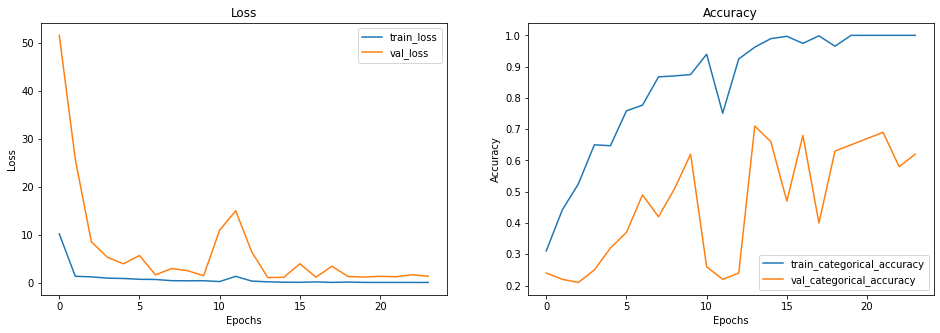

In [ ]:
# Model 11 - Conv3D Model with filter size (3,3,3)
# Same as above model without augmentation or normalization
# Optimizer - SGD
frame_height    = 100
frame_width     = 100
num_frames      = 15
size_batch      = 20
num_epochs      = 30
augment         = False
normalize       = False

model = model_Conv3D_5(num_frames, frame_height, frame_width)
optimiser = 'sgd'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())
# Run the model and check accuracy
model_history = trainer(model, 'Conv3D_5_2_SGD', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)
modelplot(model_history)


- Best Model Categorical Accuracy            | 100%            
- Best Model Validation Categorical Accuracy | 62%

Model in  diagram in 3D


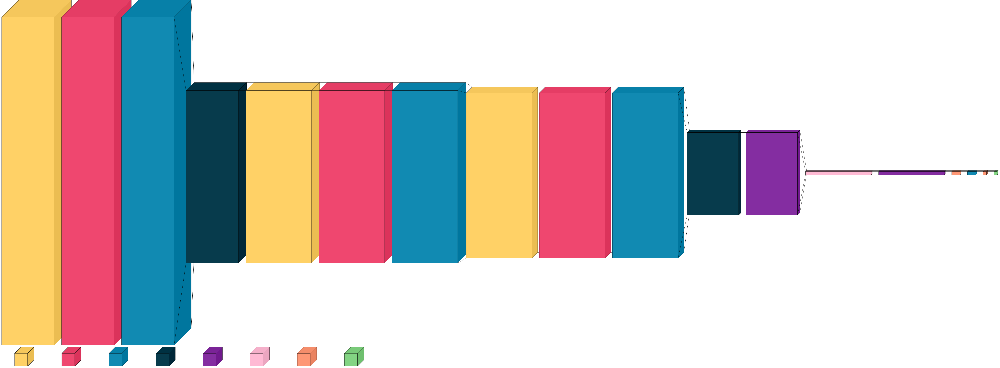

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


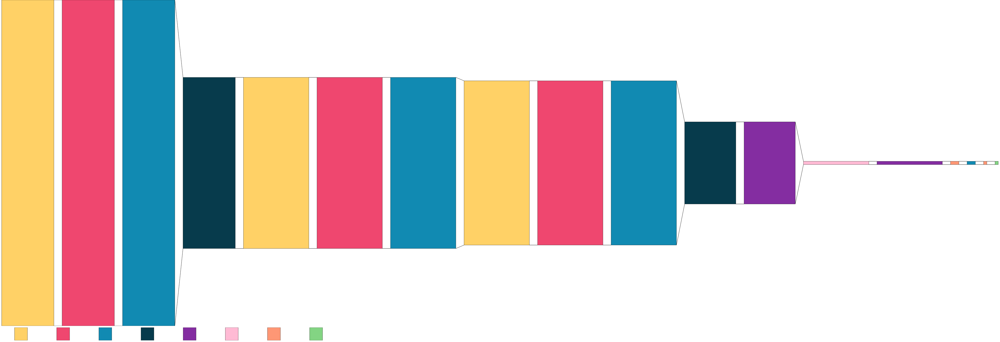

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>

- <font >There is no significant improvement in the above model architecture</font>


### <font > Model Architecture 6 - CNN LSTM Model</font>
<ul>
<li>Now, let's create an LSTM model.</li>
<li>Note that, for all the Conv3D models so far, we have used ReLU as the activation function.</li>
<li>However, for LSTM models, we will use tanh as the activation function.</li>
<li>Given that ReLUs can produce quite large outputs, they have traditionally been considered unsuitable for use with LSTMs.</li>
</ul>


In [ ]:
# CNN LSTM Model
def model_LSTM_1(num_frames, frame_height, frame_width):

    model = Sequential()
    model.add(TimeDistributed(Conv2D(16, (2, 2), padding='same'), input_shape = (num_frames, frame_height, frame_width, 3)))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))

    model.add(TimeDistributed(Conv2D(32, (2, 2), padding='same')))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))

    model.add(TimeDistributed(Conv2D(64, (2, 2), padding='same')))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(Dropout(0.2))

    model.add(TimeDistributed(Conv2D(128, (2, 2), padding='same')))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(Dropout(0.35))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(Dropout(0.35))    

    # model.add(TimeDistributed(Conv2D(256, (2, 2), padding='same')))
    # model.add(Activation('relu'))
    # model.add(TimeDistributed(BatchNormalization()))
    # model.add(TimeDistributed(MaxPooling2D((2, 2))))    
    # model.add(Dropout(0.5))
    
    model.add(TimeDistributed(Flatten()))
    
    model.add(LSTM(units=128, return_sequences=True, activation='tanh', recurrent_dropout=0.25))
    model.add(Dropout(0.25))
 
    model.add(LSTM(units=50, activation='tanh', recurrent_dropout=0.25))
    model.add(Dropout(0.25))
    
    # Final softmax layer for the 5 classes
    model.add(Dense(5))
    model.add(Activation('softmax'))
    
    return model

In [ ]:
# Model 12 - CNN LSTM Model

num_frames    = 20
frame_height  = 120
frame_width   = 120
size_batch    = 20
num_epochs    = 100
augment       = False
normalize     = False

model = model_LSTM_1(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 20, 120, 120, 16)  208      
 ibuted)                                                         
                                                                 
 activation_75 (Activation)  (None, 20, 120, 120, 16)  0         
                                                                 
 time_distributed_1 (TimeDis  (None, 20, 120, 120, 16)  64       
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 20, 60, 60, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 20, 60, 60, 32)   2080      
 tributed)                                           

In [ ]:
model_history = trainer(model, 'model_LSTM_1', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)

Source path =  /datasets/Project_data/train ; batch size = 20
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]
Epoch 1/100
34/34 [==============================] - ETA: 0s - loss: 1.4233 - categorical_accuracy: 0.3846Source path =  /datasets/Project_data/val ; batch size = 20
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]

Epoch 00001: val_categorical_accuracy improved from -inf to 0.23000, saving model to model_LSTM_1_2024-07-2809_30_59.624916/model-00001-1.42334-0.38462-2.05868-0.23000.h5
34/34 [==============================] - 50s 1s/step - loss: 1.4233 - categorical_accuracy: 0.3846 - val_loss: 2.0587 - val_categorical_accuracy: 0.2300 - lr: 0.0010
Epoch 2/100
34/34 [==============================] - ETA: 0s - loss: 1.2176 - categorical_accuracy: 0.5038
Epoch 00002: val_categorical_accuracy improved from 0.23000 to 0.32000, saving model to model_LSTM_1_2024-07-2809_30_59.624916/model-00002-1.21762-0.50377-1.48824-0.32000.

- Best Model Categorical Accuracy            | 98.34%            
- Best Model Validation Categorical Accuracy | 89%

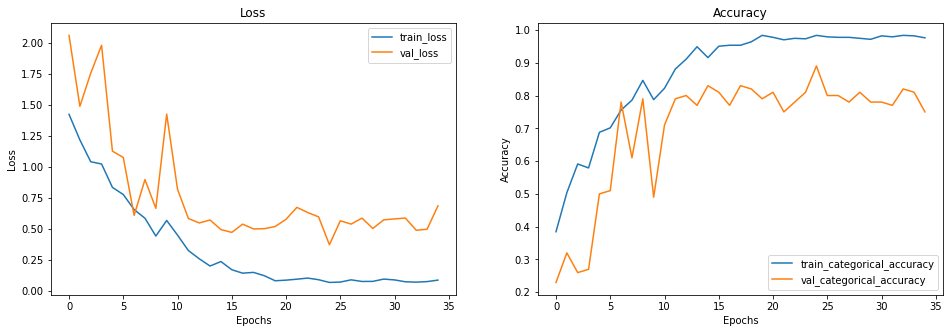

In [ ]:
modelplot(model_history)

##  <font >Observation(s):</font>

- <font >The LSTM model performed with train accuracy if 98.3% and validation accuracy of 89%</font>

###  <font >Model Architecture 7 - CNN+GRU Model</font>

- <font >Let us use GRU instead of LSTM and see its performance</font>


In [ ]:
# CNN GRU Model
def model_GRU_1(num_frames, frame_height, frame_width):

    model = Sequential()
    model.add(TimeDistributed(Conv2D(16, (2, 2), padding='same'), input_shape = (num_frames, frame_height, frame_width, 3)))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))

    model.add(TimeDistributed(Conv2D(32, (2, 2), padding='same')))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))

    model.add(TimeDistributed(Conv2D(64, (2, 2), padding='same')))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(Dropout(0.2))

    model.add(TimeDistributed(Conv2D(256, (2, 2), padding='same')))
    model.add(Activation('relu'))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(Dropout(0.25))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(Dropout(0.25))    
   
    model.add(TimeDistributed(Flatten()))
    
    model.add(GRU(units=128, return_sequences=True, activation='tanh', recurrent_dropout=0.25))
    model.add(Dropout(0.35))
 
    model.add(GRU(units=128, activation='tanh', recurrent_dropout=0.25))
    model.add(Dropout(0.5))
    
    # Final softmax layer for the 5 classes
    model.add(Dense(5))
    model.add(Activation('softmax'))
    
    return model

In [ ]:
# Model 13 - CNN GRU Model

num_frames    = 16
frame_height  = 120
frame_width   = 120
size_batch    = 50
num_epochs    = 100
augment       = False
normalize     = False

model = model_GRU_1(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_17 (TimeDi  (None, 16, 120, 120, 16)  208      
 stributed)                                                      
                                                                 
 activation_80 (Activation)  (None, 16, 120, 120, 16)  0         
                                                                 
 time_distributed_18 (TimeDi  (None, 16, 120, 120, 16)  64       
 stributed)                                                      
                                                                 
 time_distributed_19 (TimeDi  (None, 16, 60, 60, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_20 (TimeDi  (None, 16, 60, 60, 32)   2080      
 stributed)                                          

In [ ]:
# Run the model and check accuracy
model_history = trainer(model, 'model_GRU_1', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)

Source path =  /datasets/Project_data/train ; batch size = 50
Image Indexes:  [ 0  2  4  6  8 10 12 14 15 17 19 21 23 25 27 29]
Epoch 1/100
14/14 [==============================] - ETA: 0s - loss: 1.4894 - categorical_accuracy: 0.3635Source path =  /datasets/Project_data/val ; batch size = 50
Image Indexes:  [ 0  2  4  6  8 10 12 14 15 17 19 21 23 25 27 29]

Epoch 00001: val_categorical_accuracy improved from -inf to 0.23000, saving model to model_GRU_1_2024-07-2809_55_40.540043/model-00001-1.48941-0.36350-2.64360-0.23000.h5
14/14 [==============================] - 39s 3s/step - loss: 1.4894 - categorical_accuracy: 0.3635 - val_loss: 2.6436 - val_categorical_accuracy: 0.2300 - lr: 0.0010
Epoch 2/100
14/14 [==============================] - ETA: 0s - loss: 1.2530 - categorical_accuracy: 0.4600
Epoch 00002: val_categorical_accuracy did not improve from 0.23000
14/14 [==============================] - 34s 3s/step - loss: 1.2530 - categorical_accuracy: 0.4600 - val_loss: 2.8541 - val_categ

##### - Best Model Categorical Accuracy            | 99.2%            
- Best Model Validation Categorical Accuracy | 85%

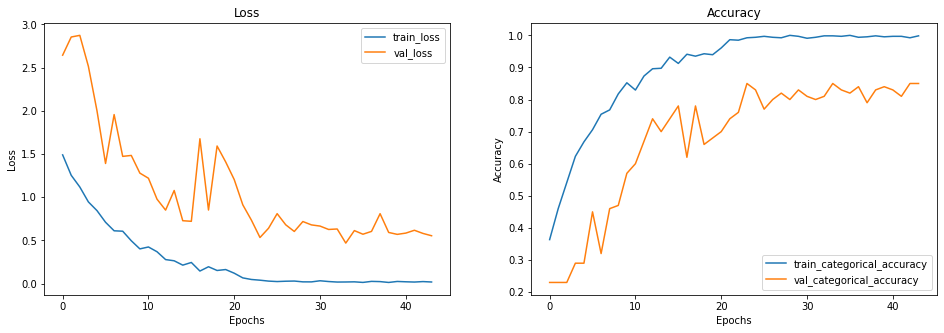

In [ ]:
modelplot(model_history)

Model in  diagram in 3D


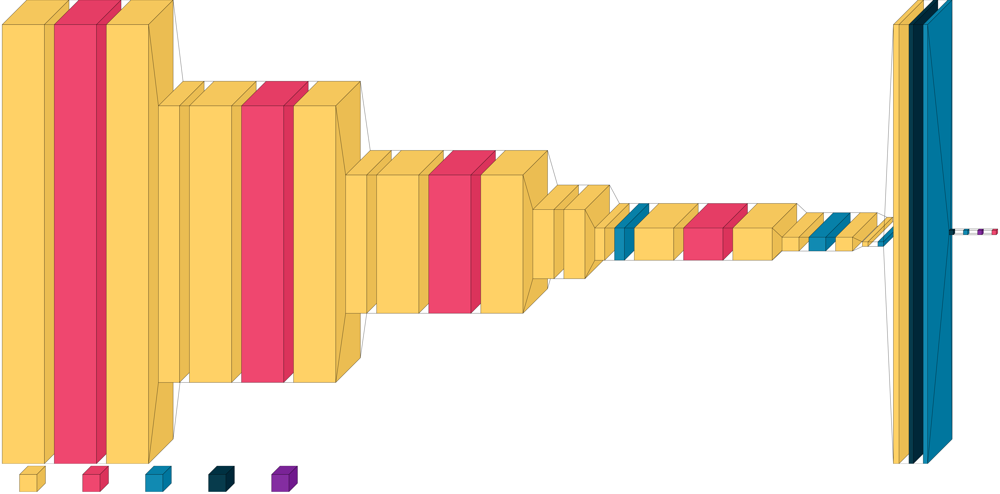

In [ ]:
print("Model in  diagram in 3D")
visualkeras.layered_view(model, spacing=45, legend=True, font=font, scale_xy=21)

Model in  diagram in 2D


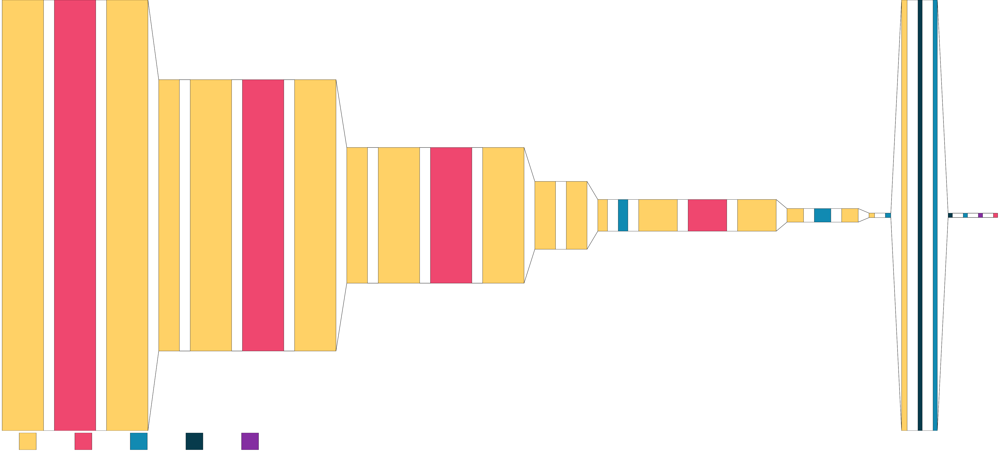

In [ ]:
print("Model in  diagram in 2D")
visualkeras.layered_view(model, spacing=50, legend=True, font=font, draw_volume=False, scale_xy=21)

##  <font >Observation(s):</font>

- <font >Accuracy of GRU model is same as LSTM </font>
- <font >Train accuracy was 99% and validation accuracy is 85%</font>



### <font > Model Architecture 8 - Transfer Learning with MobileNet + GRU Model</font>

- <font >Let us use Transfer Learning with MobileNet and GRU and see its performance</font>


In [ ]:
# MobileNet GRU Model

mobilenet_transfer = MobileNet(weights='imagenet', include_top=False)

def model_mobilenet_1(num_frames, frame_height, frame_width):

    num_class = 5
    
    model = Sequential()
    model.add(TimeDistributed(mobilenet_transfer,input_shape=(num_frames, frame_height, frame_width,3)))

    
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Flatten()))

    model.add(GRU(units=64, return_sequences=False, activation='tanh', dropout=0.5, recurrent_dropout=0.5))
    model.add(Dropout(0.25))
    
    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))
    
    model.add(Dense(num_class, activation='softmax'))
    return model

17235968/17225924 [==============================] - 2s 0us/step


In [ ]:
# Model 14 - MobileNet GRU

num_frames    = 20
frame_height  = 120
frame_width   = 120
size_batch    = 40
num_epochs    = 100
augment       = False
normalize     = True

model = model_mobilenet_1(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_34 (TimeDi  (None, 20, 3, 3, 1024)   3228864   
 stributed)                                                      
                                                                 
 time_distributed_35 (TimeDi  (None, 20, 3, 3, 1024)   4096      
 stributed)                                                      
                                                                 
 time_distributed_36 (TimeDi  (None, 20, 1, 1, 1024)   0         
 stributed)                                                      
                                                                 
 time_distributed_37 (TimeDi  (None, 20, 1024)         0         
 stributed)                                                      
                                                                 
 gru_2 (GRU)                 (None, 64)              

In [ ]:
# Run the model and check accuracy
model_history = trainer(model, 'model_mobilenet_1', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)

Source path =  /datasets/Project_data/train ; batch size = 40
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]
Epoch 1/100
17/17 [==============================] - ETA: 0s - loss: 1.5372 - categorical_accuracy: 0.3635Source path =  /datasets/Project_data/val ; batch size = 40
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]

Epoch 00001: val_categorical_accuracy improved from -inf to 0.45000, saving model to model_mobilenet_1_2024-07-2810_20_39.846153/model-00001-1.53720-0.36350-1.47897-0.45000.h5
17/17 [==============================] - 50s 3s/step - loss: 1.5372 - categorical_accuracy: 0.3635 - val_loss: 1.4790 - val_categorical_accuracy: 0.4500 - lr: 0.0010
Epoch 2/100
17/17 [==============================] - ETA: 0s - loss: 1.0109 - categorical_accuracy: 0.6048
Epoch 00002: val_categorical_accuracy improved from 0.45000 to 0.67000, saving model to model_mobilenet_1_2024-07-2810_20_39.846153/model-00002-1.01085-0.60483-0.9432

- Best Model Categorical Accuracy            | 99%            
- Best Model Validation Categorical Accuracy | 93%

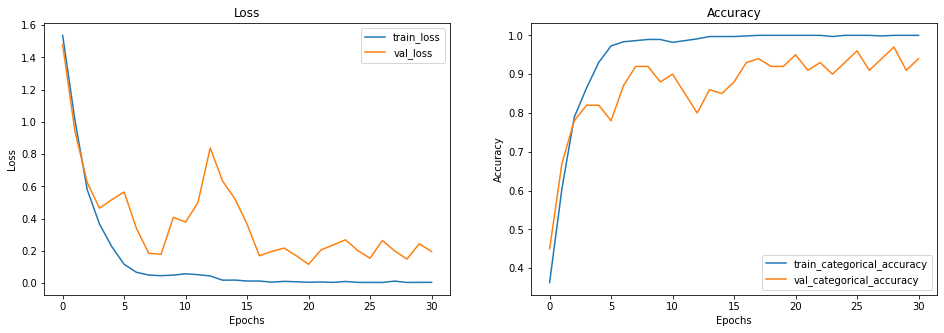

In [ ]:
modelplot(model_history)

##  <font >Observation(s):</font>

- <font >Performance of this MobileNet+GRU Model is the best so far in terms of higher validation accuracy</font>
- <font >Train accuracy is 99% and validation accuracy is 93%</font>
- <font >Model parameters ~3M</font>



###  <font >Model Architecture 9 - VGG16 LSTM Model</font>

- <font >Now let us try the VGG16 model</font>


In [ ]:
# VGG16 LSTM Model with GRU
def model_VGG16_TF_GRU(num_frames, frame_height, frame_width):

    num_class = 5
    
    def create_base():
        conv_base = VGG16(weights='imagenet',
                          include_top=False,
                          input_shape=(frame_height, frame_width, 3))
        count=0
        for layer in conv_base.layers:
            count = count+1
        print("num of layers in VGG16 " + str(count))
        # training the model after 140 layers
        split_at = 17
        for layer in conv_base.layers[:split_at]: layer.trainable = False
        for layer in conv_base.layers[split_at:]: layer.trainable = True
        x = GlobalAveragePooling2D()(conv_base.output)
        base_model = Model(conv_base.input, x)
        return base_model
    
    conv_base = create_base()
    
    ip = Input(shape=(num_frames, frame_height, frame_width, 3))
    t_conv = TimeDistributed(conv_base)(ip) 
    drop_l = Dropout(0.65)(t_conv)
    t_GRU_1 = GRU(units=128, return_sequences=True, activation='tanh', dropout=0.6, recurrent_dropout=0.6)(drop_l)
    
    t_GRU_2 = GRU(units=32, return_sequences=False, activation='tanh', dropout=0.5, recurrent_dropout=0.5)(t_GRU_1)

    f_softmax = Dense(num_class, activation='softmax')(t_GRU_2)

    model = Model(ip, f_softmax)
    
    return model

In [ ]:
# Model 15 - VGG16 transfer Learning Model with GRU

num_frames    = 18
frame_height  = 120
frame_width   = 120
size_batch    = 50
num_epochs    = 100
augment       = False
normalize     = True

model = model_VGG16_TF_GRU(num_frames, frame_height, frame_width)
optimiser = 'Adam'
model.compile(optimizer = optimiser, loss = 'categorical_crossentropy', metrics = ['categorical_accuracy'])
print(model.summary())

58900480/58889256 [==============================] - 4s 0us/step
num of layers in VGG16 19
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 18, 120, 120, 3)  0         
                             ]                                   
                                                                 
 time_distributed_38 (TimeDi  (None, 18, 512)          14714688  
 stributed)                                                      
                                                                 
 dropout_40 (Dropout)        (None, 18, 512)           0         
                                                                 
 gru_3 (GRU)                 (None, 18, 128)           246528    
                                                                 
 gru_4 (GRU)                 (None, 32)                15552     
                                  

In [ ]:
# Run the model and check accuracy
model_history = trainer(model, 'model_VGG16_TF_GRU', num_epochs, size_batch, num_frames, frame_height, frame_width, augment, normalize)

Source path =  /datasets/Project_data/train ; batch size = 50
Image Indexes:  [ 0  2  3  5  7  9 10 12 14 15 17 19 20 22 24 26 27 29]
Epoch 1/100
14/14 [==============================] - ETA: 0s - loss: 1.7319 - categorical_accuracy: 0.2051Source path =  /datasets/Project_data/val ; batch size = 50
Image Indexes:  [ 0  2  3  5  7  9 10 12 14 15 17 19 20 22 24 26 27 29]

Epoch 00001: val_categorical_accuracy improved from -inf to 0.24000, saving model to model_VGG16_TF_GRU_2024-07-2810_43_06.888108/model-00001-1.73188-0.20513-1.62799-0.24000.h5
14/14 [==============================] - 46s 3s/step - loss: 1.7319 - categorical_accuracy: 0.2051 - val_loss: 1.6280 - val_categorical_accuracy: 0.2400 - lr: 0.0010
Epoch 2/100
14/14 [==============================] - ETA: 0s - loss: 1.6804 - categorical_accuracy: 0.2428
Epoch 00002: val_categorical_accuracy did not improve from 0.24000
14/14 [==============================] - 37s 3s/step - loss: 1.6804 - categorical_accuracy: 0.2428 - val_loss:

- Best Model Categorical Accuracy            | 26.84%            
- Best Model Validation Categorical Accuracy | 34.00%

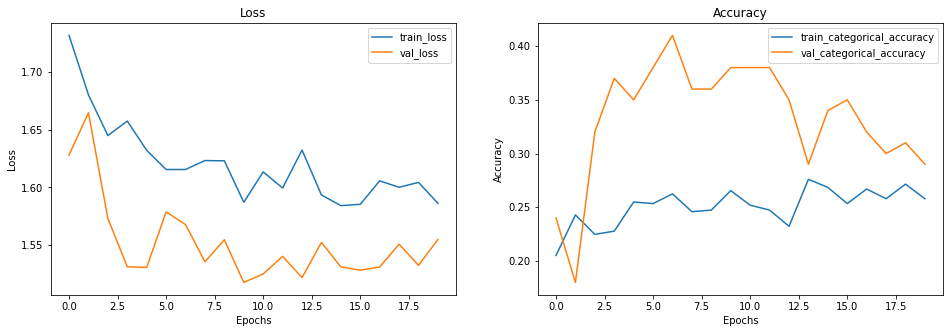

In [ ]:
modelplot(model_history)

##  <font >Observation(s):</font>

- <font >Model is Clearly Underfitting </font>
- <font > Best Model Categorical Accuracy 26.84%</font>          
- <font> Best Model Validation Categorical Accuracy 34%</font>
- <font> Total number of parameters is very high and thus is not ideally suited</font>


# <font >Optimal Model #1: Transfer Learning Model - MobileNet combined with a GRU (RNN) Model</font>


## <font >Load the optimal model#1 and test a sample</font>

- <font >Now that we have selected one of the optimal models, let's load it and use it to predict the class of a random image from the validation set. This will help us verify if the .h5 file was created correctly and if the model functions as expected.</font>


In [100]:
# Load the winner model i.e. MobileNet+GRU Model
model = load_model('model_mobilenet_1_2024-07-2810_20_39.846153/model-00017-0.01374-0.99849-0.17060-0.93000.h5')

In [101]:
model.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_34 (TimeDi  (None, 20, 3, 3, 1024)   3228864   
 stributed)                                                      
                                                                 
 time_distributed_35 (TimeDi  (None, 20, 3, 3, 1024)   4096      
 stributed)                                                      
                                                                 
 time_distributed_36 (TimeDi  (None, 20, 1, 1, 1024)   0         
 stributed)                                                      
                                                                 
 time_distributed_37 (TimeDi  (None, 20, 1024)         0         
 stributed)                                                      
                                                                 
 gru_2 (GRU)                 (None, 64)              

In [102]:
# Test the model using one random image from the validation data set

# Get one random image from validation data set
one_img = generator(val_path, val_doc, batch_size = 2, num_frames = 20, 
                    frame_height = 120, frame_width = 120, augment = False, normalize=True)
one_img_data, one_img_label = next(one_img)

# Actual Class
print('Actual Class of the Image:    ', list(one_img_label[0]).index(1))

# Predicted Class from the model
print('Predicted Class of the Image: ', np.argmax(model.predict(one_img_data), axis = 1)[0])

Source path =  /datasets/Project_data/val ; batch size = 2
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]
Actual Class of the Image:     3
Predicted Class of the Image:  3


##  <font >Observation(s):</font>

- <font >The model successfully predicted the class of the randomly chosen image.</font>


# <font >Optimal Model #2: CNN (Conv2D) + LSTM </font>

In [105]:
# LSTM
model = load_model('Best-model_LSTM_1_2024-07-2809_30_59.624916/model-00025-0.07085-0.98341-0.37390-0.89000.h5')

In [106]:
# Get one random image from validation data set
one_img = generator(val_path, val_doc, batch_size = 2, num_frames = 20, 
                    frame_height = 120, frame_width = 120, augment = False, normalize=False)
one_img_data, one_img_label = next(one_img)

# Actual Class
print('Actual Class of the Image:    ', list(one_img_label[0]).index(1))

# Predicted Class from the model
print('Predicted Class of the Image: ', np.argmax(model.predict(one_img_data), axis = 1)[0])

Source path =  /datasets/Project_data/val ; batch size = 2
Image Indexes:  [ 0  2  3  5  6  8  9 11 12 14 15 17 18 20 21 23 24 26 27 29]
Actual Class of the Image:     3
Predicted Class of the Image:  3


##  <font >Observation(s):</font>

- <font >The model has correctly predicted the class of the random image chosen</font>


# <font >Optimal Model #3 is CNN+GRU Model</font>
- <font >Least number of parameters - only 300k</font>


## <font >Load the Optimal Model #3 model and Test a sample</font>

- <font >Let us load it once and use it to predict the class of one random image from the validation set to check if the .h5 file is created correctly and if the model works</font>


In [103]:
model = load_model('model_GRU_1_2024-07-2809_55_40.540043/model-00024-0.03856-0.99246-0.53267-0.85000.h5')

In [104]:
# Test the model using one random image from the validation data set

# Get one random image from validation data set
one_img = generator(val_path, val_doc, batch_size = 2, num_frames = 16, 
                    frame_height = 120, frame_width = 120, augment = False, normalize=False)
one_img_data, one_img_label = next(one_img)

# Actual Class
print('Actual Class of the Image:    ', list(one_img_label[0]).index(1))

# Predicted Class from the model
print('Predicted Class of the Image: ', np.argmax(model.predict(one_img_data), axis = 1)[0])

Source path =  /datasets/Project_data/val ; batch size = 2
Image Indexes:  [ 0  2  4  6  8 10 12 14 15 17 19 21 23 25 27 29]
Actual Class of the Image:     3
Predicted Class of the Image:  3


##  <font >Observation(s):</font>

- <font >The model has correctly predicted the class of the random image chosen</font>